# Codes for "Sampling bias in the perceived difference between Central and Eastern Pacific El Niño teleconnections"

In [3]:
# !pip install /g/data/w97/ah3693-2/Summer_intern/eofs

In [4]:
%matplotlib inline
import sys
import os
import datetime
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import cartopy.crs as ccrs
import netCDF4 as nc
import xarray as xr
import regionmask
import pandas as pd
import geopandas as gp
from scipy import stats
import seaborn as sns
from eofs.xarray import Eof
from matplotlib import rcParams
from matplotlib import colors
from matplotlib import gridspec
from matplotlib import patches
from calendar import month_abbr
import h5py
import dask
import logging
import dask.diagnostics
dask.diagnostics.ProgressBar().register()

In [5]:
from dask.distributed import Client  
client = Client(threads_per_worker=1,memory_limit=0,silence_logs=logging.ERROR)

### Combine all plots and set WinkelTripel projection

In [6]:
import cartopy.crs as ccrs

class WinkelTripel(ccrs._WarpedRectangularProjection):
    """
    Winkel-Tripel projection implementation for Cartopy
    """

    def __init__(self, central_longitude=0.0, central_latitude=0.0, globe=None):
        globe = globe or ccrs.Globe(semimajor_axis=ccrs.WGS84_SEMIMAJOR_AXIS)
        proj4_params = [('proj', 'wintri'),
                        ('lon_0', central_longitude),
                        ('lat_0', central_latitude)]

        super(WinkelTripel, self).__init__(proj4_params, central_longitude, globe=globe)

    @property
    def threshold(self):
        return 1e4

## Import Data

In [7]:
# Mask land area
f = nc.Dataset('/g/data/w97/ah3693-2/Summer_intern/cesm2le_landmask.nc')
mask = f.variables['landmask'][:]
time_1980_2016 = xr.cftime_range(start='1980', periods=37*12, freq='MS')

In [8]:
# Mask not applied
TS_ersst_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/TS/TS_ersstv5*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(0,444)).assign_coords(time=time_1980_2016).TS
TS_r60_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/TS/TS_r60i1p1*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(24,468)).assign_coords(time=time_1980_2016).TS
TS_r67_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/TS/TS_r67i1p1*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(24,468)).assign_coords(time=time_1980_2016).TS
TS_r66_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/TS/TS_r66i1p1*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(240,684)).assign_coords(time=time_1980_2016).TS
TS_r94_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/TS/TS_r94i1p1*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(240,684)).assign_coords(time=time_1980_2016).TS

PSL_ersst_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/PSL/PSL_ersstv5*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(0,444)).assign_coords(time=time_1980_2016).PSL / 100
PSL_r60_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/PSL/PSL_r60i1p1*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(24,468)).assign_coords(time=time_1980_2016).PSL / 100
PSL_r67_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/PSL/PSL_r67i1p1*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(24,468)).assign_coords(time=time_1980_2016).PSL / 100
PSL_r66_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/PSL/PSL_r66i1p1*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(240,684)).assign_coords(time=time_1980_2016).PSL / 100
PSL_r94_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/PSL/PSL_r94i1p1*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(240,684)).assign_coords(time=time_1980_2016).PSL / 100

# Mask applied
TS_ersst = TS_ersst_nomask.where(mask!=1)
TS_r60 = TS_r60_nomask.where(mask!=1)
TS_r67 = TS_r67_nomask.where(mask!=1)
TS_r66 = TS_r66_nomask.where(mask!=1)
TS_r94 = TS_r94_nomask.where(mask!=1)

In [9]:
# Mask not applied

PRECC_ersst_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/PRECC/PRECC_ersstv5*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(0,444)).assign_coords(time=time_1980_2016).PRECC 
PRECC_r60_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/PRECC/PRECC_r60i1p1*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(24,468)).assign_coords(time=time_1980_2016).PRECC 
PRECC_r67_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/PRECC/PRECC_r67i1p1*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(24,468)).assign_coords(time=time_1980_2016).PRECC 
PRECC_r66_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/PRECC/PRECC_r66i1p1*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(240,684)).assign_coords(time=time_1980_2016).PRECC 
PRECC_r94_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/PRECC/PRECC_r94i1p1*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(240,684)).assign_coords(time=time_1980_2016).PRECC 

PRECL_ersst_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/PRECL/PRECL_ersstv5*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(0,444)).assign_coords(time=time_1980_2016).PRECL 
PRECL_r60_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/PRECL/PRECL_r60i1p1*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(24,468)).assign_coords(time=time_1980_2016).PRECL 
PRECL_r67_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/PRECL/PRECL_r67i1p1*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(24,468)).assign_coords(time=time_1980_2016).PRECL 
PRECL_r66_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/PRECL/PRECL_r66i1p1*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(240,684)).assign_coords(time=time_1980_2016).PRECL 
PRECL_r94_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/PRECL/PRECL_r94i1p1*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(240,684)).assign_coords(time=time_1980_2016).PRECL 

days_in_month = PRECC_ersst_nomask.time.dt.days_in_month

PRECIP_ersst_nomask = (PRECC_ersst_nomask + PRECL_ersst_nomask) * 3600 * 24 * days_in_month * 100
PRECIP_r60_nomask = (PRECC_r60_nomask + PRECL_r60_nomask) * 3600 * 24 * days_in_month * 100
PRECIP_r67_nomask = (PRECC_r67_nomask + PRECL_r67_nomask) * 3600 * 24 * days_in_month * 100
PRECIP_r66_nomask = (PRECC_r66_nomask + PRECL_r66_nomask) * 3600 * 24 * days_in_month * 100
PRECIP_r94_nomask = (PRECC_r94_nomask + PRECL_r94_nomask) * 3600 * 24 * days_in_month * 100

In [10]:
# Observational data 1980-2016
PSL_era5_nomask = xr.open_dataset('/g/data/w97/ah3693-2/Summer_intern/obs_extend/era5_msl_1940_2020_cesm2_192x288.nc').sel(time=slice('19800101','20161231')).msl / 100
TS_berk_nomask = xr.open_dataset('/g/data/w97/ah3693-2/Summer_intern/obs_extend/berkeley_tavg_land_1750_2023.nc').sel(time=slice('19791231','20161231')).assign_coords(time=PSL_era5_nomask.time).temperature
SST_ersst = xr.open_dataset('/g/data/w97/ah3693/2022S2ASC/ERSSTv5.nc').sel(time=slice('19800101','20161231')).assign_coords(time=time_1980_2016).sst
SST_ersst = SST_ersst.sortby(SST_ersst.coords['lat'][::-1])
PRECIP_gpcp_nomask = xr.open_dataset('/g/data/w97/ah3693-2/Summer_intern/obs_extend/precip_gpcp_197901-202012_cesm2_cam6_288x192.nc').sel(time=slice('19800101','20161231')).precip

0.3.0


## Anomaly

In [11]:
# Calculate sst anomaly
SST_ersst_anom, TS_ersst_anom, TS_r60_anom, TS_r67_anom, TS_r66_anom, TS_r94_anom = [sst.groupby("time.month") - sst.groupby("time.month").mean(dim="time") for sst in [SST_ersst, TS_ersst, TS_r60, TS_r67, TS_r66, TS_r94]]
TS_berk_nomask_anom, TS_ersst_nomask_anom, TS_r60_nomask_anom, TS_r67_nomask_anom, TS_r66_nomask_anom, TS_r94_nomask_anom = [sst.groupby("time.month") - sst.groupby("time.month").mean(dim="time") for sst in [TS_berk_nomask, TS_ersst_nomask, TS_r60_nomask, TS_r67_nomask, TS_r66_nomask, TS_r94_nomask]]
PSL_era5_nomask_anom, PSL_ersst_nomask_anom, PSL_r60_nomask_anom, PSL_r67_nomask_anom, PSL_r66_nomask_anom, PSL_r94_nomask_anom = [(sst.groupby("time.month") - sst.groupby("time.month").mean(dim="time")) for sst in [PSL_era5_nomask, PSL_ersst_nomask, PSL_r60_nomask, PSL_r67_nomask, PSL_r66_nomask, PSL_r94_nomask]]
PRECIP_gpcp_nomask_anom = 100*(PRECIP_gpcp_nomask.groupby("time.month") / PRECIP_gpcp_nomask.groupby("time.month").mean(dim='time') - 1)
PRECIP_ersst_nomask_anom, PRECIP_r60_nomask_anom, PRECIP_r67_nomask_anom, PRECIP_r66_nomask_anom, PRECIP_r94_nomask_anom = [(sst.groupby("time.month") / sst.groupby("time.month").mean(dim="time") - 1)*100 for sst in [PRECIP_ersst_nomask, PRECIP_r60_nomask, PRECIP_r67_nomask, PRECIP_r66_nomask, PRECIP_r94_nomask]]

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/indexing.py:1446: PerformanceWarning: Slicing with an out-of-order index is generating 37 times more chunks
  return self.array[key]
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/indexing.py:1446: PerformanceWarning: Slicing with an out-of-order index is generating 37 times more chunks
  return self.array[key]
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/indexing.py:1446: PerformanceWarning: Slicing with an out-of-order index is generating 37 times more chunks
  return self.array[key]
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/indexing.py:1446: PerformanceWarning: Slicing with an out-of-order index is generating 37 times more chunks
  return self.array[key]
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-pack

## Detrend

In [12]:
def detrend(df, dim):
    # detrend along a single dimension
    p = df.polyfit(dim=dim, deg=1)
    fit = xr.polyval(df[dim], p.polyfit_coefficients)
    return (df - fit).compute()

In [13]:
# Detrend TS anomaly
TS_ersst_detrended, TS_r60_detrended, TS_r67_detrended, TS_r66_detrended, TS_r94_detrended = [detrend(sst_anom, dim='time').transpose("time", "lat", "lon","ens_number") for sst_anom in [TS_ersst_anom, TS_r60_anom, TS_r67_anom, TS_r66_anom, TS_r94_anom]]
TS_ersst_nomask_detrended, TS_r60_nomask_detrended, TS_r67_nomask_detrended, TS_r66_nomask_detrended, TS_r94_nomask_detrended = [detrend(sst_anom, dim='time').transpose("time", "lat", "lon","ens_number") for sst_anom in [TS_ersst_nomask_anom, TS_r60_nomask_anom, TS_r67_nomask_anom, TS_r66_nomask_anom, TS_r94_nomask_anom]]
PSL_ersst_nomask_detrended, PSL_r60_nomask_detrended, PSL_r67_nomask_detrended, PSL_r66_nomask_detrended, PSL_r94_nomask_detrended = [detrend(slp_anom, dim='time').transpose("time", "lat", "lon","ens_number") for slp_anom in [PSL_ersst_nomask_anom, PSL_r60_nomask_anom, PSL_r67_nomask_anom, PSL_r66_nomask_anom, PSL_r94_nomask_anom]]
SST_ersst_detrended, TS_berk_nomask_detrended, PSL_era5_nomask_detrended = [detrend(sst_or_slp_anom, dim='time').transpose("time", "lat", "lon") for sst_or_slp_anom in [SST_ersst_anom, TS_berk_nomask_anom, PSL_era5_nomask_anom]]
PRECIP_ersst_nomask_detrended, PRECIP_r60_nomask_detrended, PRECIP_r67_nomask_detrended, PRECIP_r66_nomask_detrended, PRECIP_r94_nomask_detrended = [detrend(sst_anom, dim='time').transpose("time", "lat", "lon","ens_number").compute() for sst_anom in [PRECIP_ersst_nomask_anom, PRECIP_r60_nomask_anom, PRECIP_r67_nomask_anom, PRECIP_r66_nomask_anom, PRECIP_r94_nomask_anom]]
PRECIP_gpcp_nomask_detrended = detrend(PRECIP_gpcp_nomask_anom, dim='time').transpose("time", "lat", "lon").compute()

### Concat all LIM simulations

In [14]:
# concat all LIM realisation together: dimension = 10 ens members of each concat timeseries
TS_LIM_detrended = xr.concat([TS_r60_detrended, TS_r67_detrended, TS_r66_detrended, TS_r94_detrended],dim='time')
TS_LIM_nomask_detrended = xr.concat([TS_r60_nomask_detrended,TS_r67_nomask_detrended,TS_r66_nomask_detrended,TS_r94_nomask_detrended],dim='time')
PSL_LIM_nomask_detrended = xr.concat([PSL_r60_nomask_detrended,PSL_r67_nomask_detrended,PSL_r66_nomask_detrended,PSL_r94_nomask_detrended],dim='time')
PRECIP_LIM_nomask_detrended = xr.concat([PRECIP_r60_nomask_detrended, PRECIP_r67_nomask_detrended, PRECIP_r66_nomask_detrended, PRECIP_r94_nomask_detrended],dim='time')

new_time = xr.cftime_range(start='1000', periods=1776, freq='MS')
TS_LIM_detrended = TS_LIM_detrended.assign_coords(time=new_time)
TS_LIM_nomask_detrended = TS_LIM_nomask_detrended.assign_coords(time=new_time)
PSL_LIM_nomask_detrended = PSL_LIM_nomask_detrended.assign_coords(time=new_time)
PRECIP_LIM_nomask_detrended = PRECIP_LIM_nomask_detrended.assign_coords(time=new_time)

## Find first two PCs using EOFs

In [15]:
def find_PCs(TS_data,nmodes,no_ens = False):
    # function for calculating EOF and PC
    def apply_eof(data_slice):
        eof_solver = Eof(data_slice)
        eofs = eof_solver.eofs(neofs=nmodes) # eof_solver.eofsAsCorrelation(neofs=1)
        # vf = eof_solver.varianceFraction(neigs=nmodes)
        pcs = eof_solver.pcs(pcscaling=1, npcs=nmodes)
        return eofs, pcs
    
    # Slice the ENSO significant region of tropical Pacific
    if no_ens == True:
        TS_detrended_enso = TS_data.sel(lat=slice(-20,20)).sel(lon=slice(140,280)).compute()
    else:
        TS_detrended_enso = TS_data.sel(ens_number=0).sel(lat=slice(-20,20)).sel(lon=slice(140,280)).compute()
    EOFs, PCs = apply_eof(TS_detrended_enso) #.groupby('ens_number').apply(apply_eof)

    return EOFs, PCs

In [16]:
SST_ersst_EOFs, SST_ersst_PCs = find_PCs(SST_ersst_detrended,2,no_ens = True)
TS_ersst_EOFs, TS_ersst_PCs = find_PCs(TS_ersst_detrended,2)
TS_LIM_EOFs, TS_LIM_PCs = find_PCs(TS_LIM_detrended,2)

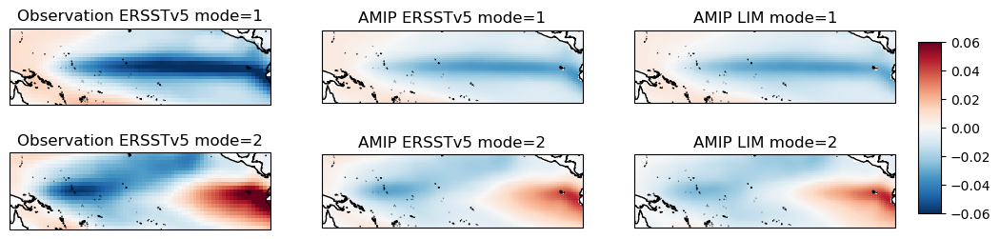

In [17]:
# Plot of EOF modes of three experiments
fig, axes = plt.subplots(2,3,figsize=(12,3),subplot_kw=dict(projection=ccrs.PlateCarree(central_longitude=180)))
for TS_num, TS_EOFs in enumerate([SST_ersst_EOFs, TS_ersst_EOFs, TS_LIM_EOFs]):
    ax = axes[0,TS_num]
    p = TS_EOFs.sel(mode=0).plot(ax=ax,cmap='RdBu_r',transform=ccrs.PlateCarree(),vmin=-0.06, vmax=0.06, add_colorbar=False)
    ax.coastlines()
        
    ax = axes[1,TS_num]
    p = TS_EOFs.sel(mode=1).plot(ax=ax,cmap='RdBu_r',transform=ccrs.PlateCarree(),vmin=-0.06, vmax=0.06, add_colorbar=False)
    ax.coastlines()

axes[0,0].set_title('Observation ERSSTv5 mode=1')
axes[1,0].set_title('Observation ERSSTv5 mode=2')
axes[0,1].set_title('AMIP ERSSTv5 mode=1')
axes[1,1].set_title('AMIP ERSSTv5 mode=2')
axes[0,2].set_title('AMIP LIM mode=1')
axes[1,2].set_title('AMIP LIM mode=2')

cax = plt.axes([0.92, 0.2, 0.02, 0.6]) #[left, bottom, width, height]
plt.colorbar(p,cax=cax,orientation='vertical')
plt.subplots_adjust(wspace=0.2,hspace=0.3)
plt.show()

In [18]:
# Change the signs of the EOFs and PCs 
SST_ersst_EOFs = -SST_ersst_EOFs
SST_ersst_PCs = -SST_ersst_PCs
TS_ersst_EOFs = -TS_ersst_EOFs
TS_ersst_PCs = -TS_ersst_PCs
TS_LIM_EOFs = -TS_LIM_EOFs
TS_LIM_PCs = -TS_LIM_PCs

In [19]:
# Quadratic fit to PC1 and PC2, fit[ens][a,b,c] for quadratic function
SST_ersst_PCs_fit = np.polyfit(SST_ersst_PCs.sel(mode=0),SST_ersst_PCs.sel(mode=1),2)
TS_ersst_PCs_fit = np.polyfit(TS_ersst_PCs.sel(mode=0),TS_ersst_PCs.sel(mode=1),2)
TS_LIM_PCs_fit = np.polyfit(TS_LIM_PCs.sel(mode=0),TS_LIM_PCs.sel(mode=1),2) 

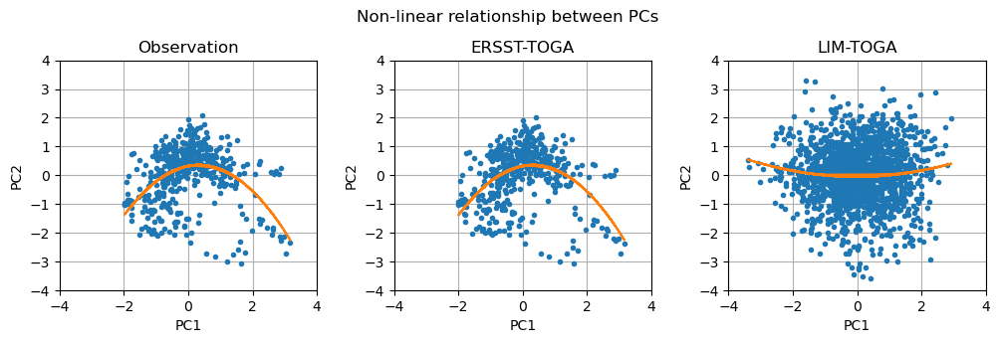

In [20]:
# Monthly PC1 and PC2 plots
TS_PCs = [SST_ersst_PCs, TS_ersst_PCs, TS_LIM_PCs]

fig, axes = plt.subplots(1,3,figsize=(12,3))
for TS_num, TS_PCs_fit in enumerate([SST_ersst_PCs_fit, TS_ersst_PCs_fit, TS_LIM_PCs_fit]):
    ax = axes[TS_num]
    PC1 = TS_PCs[TS_num].sel(mode=0)
    PC2 = TS_PCs[TS_num].sel(mode=1)
    fit = TS_PCs_fit[0]*(PC1**2)+TS_PCs_fit[1]*(PC1)+TS_PCs_fit[2]
    ax.plot(PC1, PC2,'.')
    ax.plot(PC1, fit)
    ax.set_xlim((-4,4))
    ax.set_ylim((-4,4))
    ax.grid()
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    
axes[0].set_title('Observation')
axes[1].set_title('ERSST-TOGA')
axes[2].set_title('LIM-TOGA')
plt.suptitle('Non-linear relationship between PCs',y=1.05)
plt.subplots_adjust(wspace=0.3,hspace=0.5)
plt.show()

In [21]:
# function for calculating E and C index
def E_and_C_index(TS_PCs):
    PC1 = TS_PCs.sel(mode=0)
    PC2 = TS_PCs.sel(mode=1)

    E = - TS_PCs.diff(dim='mode') / (np.sqrt(2))
    C = TS_PCs.sum(dim='mode') / (np.sqrt(2))
    return E.squeeze(dim='mode'), C

In [22]:
# Calculate the E and C index
SST_ersst_E, SST_ersst_C = E_and_C_index(SST_ersst_PCs)
TS_ersst_E, TS_ersst_C = E_and_C_index(TS_ersst_PCs)
TS_LIM_E, TS_LIM_C = E_and_C_index(TS_LIM_PCs)

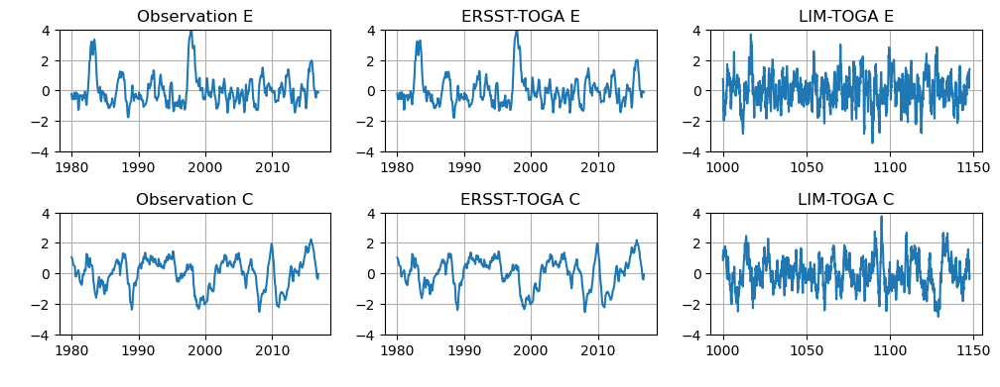

In [23]:
# E and C index plot
TS_E = [SST_ersst_E, TS_ersst_E, TS_LIM_E]
TS_C = [SST_ersst_C, TS_ersst_C, TS_LIM_C]

fig, axes = plt.subplots(2,3,figsize=(12,4))
for TS_num in range(3):
    ax = axes[0,TS_num]
    TS_E[TS_num].plot(ax=ax)
    ax.set_ylim((-4,4))
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    ax.set_title(' ')
    ax.grid()
        
    ax = axes[1,TS_num]
    TS_C[TS_num].plot(ax=ax)
    ax.set_ylim((-4,4))
    ax.set_xlabel(' ')
    ax.set_ylabel(' ')
    ax.set_title(' ')
    ax.grid()

axes[0,0].set_title('Observation E')
axes[1,0].set_title('Observation C')
axes[0,1].set_title('ERSST-TOGA E')
axes[1,1].set_title('ERSST-TOGA C')
axes[0,2].set_title('LIM-TOGA E')
axes[1,2].set_title('LIM-TOGA C')

plt.subplots_adjust(wspace=0.2,hspace=0.5)
plt.show()

## Calculate Nino3.4 Index

In [24]:
# Nino3.4 Calculation
def nino34index(TS_detrended):
    TS_nino34 = TS_detrended.sel(lat=slice(-5,5)).sel(lon=slice(190,240)).mean(dim=['lat','lon'])
    return TS_nino34

In [25]:
# Nino3.4 Index Calculation
SST_ersst_nino34 = nino34index(SST_ersst_detrended)
TS_ersst_nino34 = nino34index(TS_ersst_detrended.sel(ens_number=0))
TS_LIM_nino34 = nino34index(TS_LIM_detrended.sel(ens_number=0))

## Identify ENSO events

In [29]:
# Identify ENSO events
def enso_events(TS_nino34, thr = 0.5):
    ndj_mean = TS_nino34.sel(time=TS_nino34.time.dt.month.isin([11,12,1])).resample(time = 'YS-NOV').mean(dim='time')
    std = TS_nino34.std(dim='time')
    elnino = ndj_mean.where(ndj_mean >= thr*std).dropna(dim='time')
    lanina = ndj_mean.where(ndj_mean <= -thr*std).dropna(dim='time')

    elnino_year = elnino.time.dt.year.values
    lanina_year = lanina.time.dt.year.values
    
    return elnino_year, lanina_year

In [30]:
# El Nino and La Nina years selections (years having the peaking December is being selected)
SST_ersst_EN, SST_ersst_LN = enso_events(SST_ersst_nino34)
TS_ersst_EN, TS_ersst_LN = enso_events(TS_ersst_nino34)
TS_LIM_EN, TS_LIM_LN = enso_events(TS_LIM_nino34)

In [ ]:
# Remove he years that are at the time boundry
SST_ersst_EN = np.delete(SST_ersst_EN, np.where(SST_ersst_EN == 1979))
TS_ersst_EN = np.delete(TS_ersst_EN, np.where(TS_ersst_EN == 1979))
TS_LIM_EN = np.delete(TS_LIM_EN, [np.where(TS_LIM_EN == 999), np.where(TS_LIM_EN == 1073), np.where(TS_LIM_EN == 1147)])

In [32]:
def enso_events_absolute_value(TS_nino34, thr = 1.0):
    ndj_mean = TS_nino34.sel(time=TS_nino34.time.dt.month.isin([11,12,1])).resample(time = 'YS-NOV').mean(dim='time')
    std = TS_nino34.std(dim='time')
    elnino = ndj_mean.where(ndj_mean >= thr).dropna(dim='time')
    lanina = ndj_mean.where(ndj_mean <= -thr).dropna(dim='time')

    elnino_year = elnino.time.dt.year.values
    lanina_year = lanina.time.dt.year.values
    
    return elnino_year, lanina_year

## Distinguish ENSO events into EP and CP

In [33]:
def CP_EP_ENSO(E_index, C_index, EN_year, LN_year):

    CP_EN = []
    EP_EN = []
    CP_LN = []
    EP_LN = []
    E_rolling = E_index.rolling(time=3, center=True).mean()
    C_rolling = C_index.rolling(time=3, center=True).mean()
    
    for year in EN_year:
        E_value = E_rolling.sel(time=(E_rolling.time.dt.year == year) & (E_rolling.time.dt.month == 12))
        C_value = C_rolling.sel(time=(C_rolling.time.dt.year == year) & (C_rolling.time.dt.month == 12))
        if abs(C_value) >= abs(E_value) + 0.4:
            CP_EN.append(year)
        else:
            EP_EN.append(year)
    
    for year in LN_year:
        E_value = E_rolling.sel(time=(E_rolling.time.dt.year == year) & (E_rolling.time.dt.month == 12))
        C_value = C_rolling.sel(time=(C_rolling.time.dt.year == year) & (C_rolling.time.dt.month == 12))
        if abs(C_value) >= abs(E_value) + 0.4:
            CP_LN.append(year)
        else:
            EP_LN.append(year)

    return EN_year.tolist(), EP_EN, CP_EN, LN_year.tolist(), EP_LN, CP_LN

In [34]:
# Distinguish EP and CP (for both El Nino and La Nina) - EP_El_Nino, CP_El_Nino, EP_La_Nina, CP_La_Nina
SST_ersst_EPCP = CP_EP_ENSO(SST_ersst_E, SST_ersst_C, SST_ersst_EN, SST_ersst_LN)
TS_ersst_EPCP = CP_EP_ENSO(TS_ersst_E, TS_ersst_C, TS_ersst_EN, TS_ersst_LN)
TS_LIM_EPCP = CP_EP_ENSO(TS_LIM_E, TS_LIM_C, TS_LIM_EN, TS_LIM_LN)

In [35]:
print(SST_ersst_EPCP[1:3])
print(TS_ersst_EPCP[1:3])

([1982, 1986, 1991, 1997, 2006, 2015], [1987, 1994, 2002, 2004, 2009, 2014])
([1982, 1986, 1997, 2006, 2015], [1987, 1991, 1994, 2002, 2004, 2009, 2014])


In [36]:
# SST_1991_E = SST_ersst_E.where(SST_ersst_E.time.dt.year.isin([1991,1992]), drop = True).rolling(time=3, center=True).mean()
# SST_1991_E.sel(time=(SST_1991_E.time.dt.year == 1991) & (SST_1991_E.time.dt.month == 12)).values

In [37]:
# SST_1991_C = SST_ersst_C.where(SST_ersst_C.time.dt.year.isin([1991,1992]), drop = True).rolling(time=3, center=True).mean()
# SST_1991_C.sel(time=(SST_1991_C.time.dt.year == 1991) & (SST_1991_C.time.dt.month == 12)).values

In [38]:
# TS_1991_E = TS_ersst_E.where(TS_ersst_E.time.dt.year.isin([1991,1992]), drop = True).rolling(time=3, center=True).mean()
# TS_1991_E.sel(time=(TS_1991_E.time.dt.year == 1991) & (TS_1991_E.time.dt.month == 12)).values

In [39]:
# TS_1991_C = TS_ersst_C.where(TS_ersst_C.time.dt.year.isin([1991,1992]), drop = True).rolling(time=3, center=True).mean()
# TS_1991_C.sel(time=(TS_1991_C.time.dt.year == 1991) & (TS_1991_C.time.dt.month == 12)).values

In [40]:
# SST_ersst_ndj_1991 = SST_ersst_detrended.sel(time = slice('19911101','19920101')).mean(dim='time')
# TS_ersst_ndj_1991 = TS_ersst_detrended.isel(ens_number = 0).sel(time = slice('19911101','19920101')).mean(dim='time')

# fig, axes = plt.subplots(1,2,figsize=(8,3),subplot_kw=dict(projection=ccrs.PlateCarree(central_longitude=180)))
# for TS_num, TS_ndj in enumerate([SST_ersst_ndj_1991, TS_ersst_ndj_1991]):
#     ax = axes[TS_num]
#     p = TS_ndj.sel(lat=slice(-20,20), drop = True).sel(lon=slice(120,290), drop = True).plot(ax=ax,cmap='RdBu_r',transform=ccrs.PlateCarree(),vmin=-2, vmax=2, add_colorbar=False)
#     ax.coastlines()
#     ax.set_xticks(np.arange(130,300,30), crs=ccrs.PlateCarree())
#     ax.set_xticklabels(['130°E','160°E','170°W','140°W','110°W','80°W'],fontsize=8)
#     ax.set_xlabel(' ')
#     ax.set_yticks(np.arange(-20,30,10), crs=ccrs.PlateCarree())
#     ax.set_yticklabels(['20°S','10°S','0°','10°N','20°N'],fontsize=8)
#     ax.set_ylabel(' ')

# axes[0].set_title('Observation ERSSTv5')
# axes[1].set_title('AMIP ERSSTv5')

# plt.suptitle('1991 NDJ mean SST in tropical Pacific')
# cax = plt.axes([0.92, 0.2, 0.02, 0.6]) #[left, bottom, width, height]
# plt.colorbar(p,cax=cax,orientation='vertical')
# plt.subplots_adjust(wspace=0.2,hspace=0.3)
# plt.show()

I think 1991 should be a CP El Nino event. Therefore, for later calculation, TS_ersst_EPCP is used instead of SST_ersst_EPCP.

In [41]:
# NDJ mean of nino34 index
SST_ersst_nino34_ndj = SST_ersst_nino34.sel(time = SST_ersst_nino34.time.dt.month.isin([11,12,1])).resample(time = 'YS-NOV').mean(dim='time')
TS_ersst_nino34_ndj = TS_ersst_nino34.sel(time = TS_ersst_nino34.time.dt.month.isin([11,12,1])).resample(time = 'YS-NOV').mean(dim='time')
TS_LIM_nino34_ndj = TS_LIM_nino34.sel(time = TS_LIM_nino34.time.dt.month.isin([11,12,1])).resample(time = 'YS-NOV').mean(dim='time')

# Select out ENSO years for the NDJ mean of nino34 index
SST_ersst_nino34_for_histogram = [SST_ersst_nino34_ndj.sel(time = SST_ersst_nino34_ndj.time.dt.year.isin([TS_ersst_EPCP[epcp_order]])).compute() for epcp_order in range(6)]
TS_ersst_nino34_for_histogram = [TS_ersst_nino34_ndj.sel(time = TS_ersst_nino34_ndj.time.dt.year.isin([TS_ersst_EPCP[epcp_order]])).compute() for epcp_order in range(6)]
TS_LIM_nino34_for_histogram = [TS_LIM_nino34_ndj.sel(time = TS_LIM_nino34_ndj.time.dt.year.isin([TS_LIM_EPCP[epcp_order]])).compute() for epcp_order in range(6)]

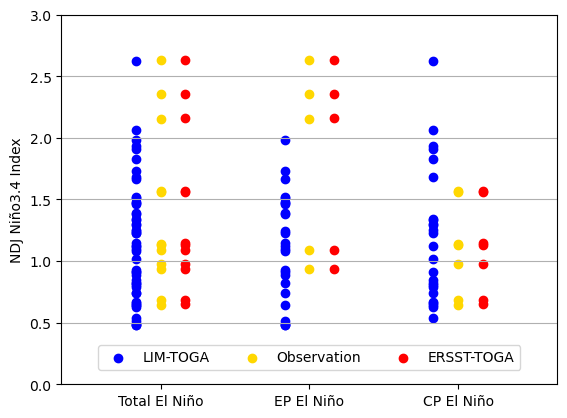

In [46]:
# Scatter plot
fig, ax = plt.subplots()
plt.grid(axis = 'y')
# All ENSO events
total_TS_LIM = plt.scatter(1.5*np.ones(len(TS_LIM_nino34_for_histogram[0])), TS_LIM_nino34_for_histogram[0], marker='o', c = 'blue', label = 'LIM-TOGA')
total_SST_ersst = plt.scatter(2.0*np.ones(len(SST_ersst_nino34_for_histogram[0])), SST_ersst_nino34_for_histogram[0], marker='o', c = 'gold', label = 'Observation')
total_TS_ersst = plt.scatter(2.5*np.ones(len(TS_ersst_nino34_for_histogram[0])), TS_ersst_nino34_for_histogram[0], marker='o', c = 'red', label = 'ERSST-TOGA')

total_TS_LIM = plt.scatter(4.5*np.ones(len(TS_LIM_nino34_for_histogram[1])), TS_LIM_nino34_for_histogram[1], marker='o', c = 'blue')
total_SST_ersst = plt.scatter(5.0*np.ones(len(SST_ersst_nino34_for_histogram[1])), SST_ersst_nino34_for_histogram[1], marker='o', c = 'gold')
total_TS_ersst = plt.scatter(5.5*np.ones(len(TS_ersst_nino34_for_histogram[1])), TS_ersst_nino34_for_histogram[1], marker='o', c = 'red')

total_TS_LIM = plt.scatter(7.5*np.ones(len(TS_LIM_nino34_for_histogram[2])), TS_LIM_nino34_for_histogram[2], marker='o', c = 'blue')
total_SST_ersst = plt.scatter(8.0*np.ones(len(SST_ersst_nino34_for_histogram[2])), SST_ersst_nino34_for_histogram[2], marker='o', c = 'gold')
total_TS_ersst = plt.scatter(8.5*np.ones(len(TS_ersst_nino34_for_histogram[2])), TS_ersst_nino34_for_histogram[2], marker='o', c = 'red')


plt.xlim(0,10)
plt.ylim(0,3)
plt.xticks([2,5,8])
ax.set_xticklabels(['Total El Niño', 'EP El Niño', 'CP El Niño'])
plt.ylabel('NDJ Niño3.4 Index')
plt.legend(loc='lower center', bbox_to_anchor=(0.5, 0.02), ncol=3, fancybox=True)
plt.show()

## DJF composites of CP and EP El Nino events

### Select and calculate all DJF mean for every ENSO year

In [47]:
# Select and calculate all DJF mean for every ENSO year
# Not averaged over time dimension or ens_number dimension
def select_enso_djf(climate_parameter,ENSO_year):

    seasonal_mean = climate_parameter.resample(time='QS-DEC').mean()
    parameter_year1 = seasonal_mean.sel(time=seasonal_mean.time.dt.year.isin([ENSO_year]))
    djf = parameter_year1.sel(time=parameter_year1.time.dt.month.isin([12]))
    
    return djf

In [48]:
# Select out all ENSO year DJF mean for each climate parameter
# SST_ersst_EPCP is not used!!!
SST_ersst_djf = [select_enso_djf(SST_ersst_detrended, TS_ersst_EPCP[i]) for i in [1,2]]
TS_berk_djf = [select_enso_djf(TS_berk_nomask_detrended, TS_ersst_EPCP[i]) for i in [1,2]]
TS_ersst_djf = [select_enso_djf(TS_ersst_nomask_detrended, TS_ersst_EPCP[i]) for i in [1,2]]
TS_LIM_djf = [select_enso_djf(TS_LIM_nomask_detrended, TS_LIM_EPCP[i]) for i in [1,2]]

PSL_era5_djf = [select_enso_djf(PSL_era5_nomask_detrended, TS_ersst_EPCP[i]) for i in [1,2]]
PSL_ersst_djf = [select_enso_djf(PSL_ersst_nomask_detrended, TS_ersst_EPCP[i]) for i in [1,2]]
PSL_LIM_djf = [select_enso_djf(PSL_LIM_nomask_detrended, TS_LIM_EPCP[i]) for i in [1,2]]

PRECIP_gpcp_djf = [select_enso_djf(PRECIP_gpcp_nomask_detrended, TS_ersst_EPCP[i]) for i in [1,2]]
PRECIP_ersst_djf = [select_enso_djf(PRECIP_ersst_nomask_detrended, TS_ersst_EPCP[i]) for i in [1,2]]
PRECIP_LIM_djf = [select_enso_djf(PRECIP_LIM_nomask_detrended, TS_LIM_EPCP[i]) for i in [1,2]]

### DJF mean of nino3.4 over ENSO events

In [50]:
# Nino3.4 for scaling
SST_ersst_nino34_djf = [select_enso_djf(SST_ersst_nino34, TS_ersst_EPCP[i]).mean(dim='time').values for i in [1,2]]
TS_ersst_nino34_djf = [select_enso_djf(TS_ersst_nino34, TS_ersst_EPCP[i]).mean(dim='time').values for i in [1,2]]
TS_LIM_nino34_djf = [select_enso_djf(TS_LIM_nino34, TS_LIM_EPCP[i]).mean(dim='time').values for i in [1,2]]

In [51]:
print(SST_ersst_nino34_djf)
print(TS_ersst_nino34_djf)
print(TS_LIM_nino34_djf)

[array(1.72589079), array(0.98944239)]
[array(1.72663181), array(0.9903672)]
[array(1.04816201), array(1.1427346)]


In [52]:
# Nino3.4 for scaling - not averaged - all nino3.4
SST_ersst_nino34_djf_all = [select_enso_djf(SST_ersst_nino34, TS_ersst_EPCP[i]).values for i in [1,2]]
TS_ersst_nino34_djf_all = [select_enso_djf(TS_ersst_nino34, TS_ersst_EPCP[i]).values for i in [1,2]]
TS_LIM_nino34_djf_all = [select_enso_djf(TS_LIM_nino34, TS_LIM_EPCP[i]).values for i in [1,2]]

### DJF CP - EP difference t-test significance

In [55]:
def two_sample_diff_ttest(a, b,axis=[0,3]): # axis=0 time; axis=3 ens_number
    t_test = stats.ttest_ind(a, b, axis=axis)
    return xr.DataArray(t_test[1], dims=['lat','lon'], 
                        coords=dict(
                        lat=(['lat'], a.lat.values),
                        lon=(['lon'], a.lon.values))
                        )

In [57]:
# With scaling, all events
SST_ersst_djf_CPEP_diff_ttest_nino34 = two_sample_diff_ttest(SST_ersst_djf[1]/SST_ersst_nino34_djf[1], SST_ersst_djf[0]/SST_ersst_nino34_djf[0], axis = [0])
TS_berk_djf_CPEP_diff_ttest_nino34 = two_sample_diff_ttest(TS_berk_djf[1]/SST_ersst_nino34_djf[1], TS_berk_djf[0]/SST_ersst_nino34_djf[0], axis = [0])
TS_ersst_djf_CPEP_diff_ttest_nino34 = two_sample_diff_ttest(TS_ersst_djf[1]/TS_ersst_nino34_djf[1], TS_ersst_djf[0]/TS_ersst_nino34_djf[0], axis = [0,3])
TS_LIM_djf_CPEP_diff_ttest_nino34 = two_sample_diff_ttest(TS_LIM_djf[1]/TS_LIM_nino34_djf[1], TS_LIM_djf[0]/TS_LIM_nino34_djf[0], axis = [0,3])
TS_LminusE_djf_CPEP_diff_ttest_nino34 = two_sample_diff_ttest(TS_LIM_djf[1]/TS_LIM_nino34_djf[1] - TS_LIM_djf[0]/TS_LIM_nino34_djf[0], TS_ersst_djf[1]/TS_ersst_nino34_djf[1] - TS_ersst_djf[0]/TS_ersst_nino34_djf[0], axis = [0,3])

PSL_era5_djf_CPEP_diff_ttest_nino34 = two_sample_diff_ttest(PSL_era5_djf[1]/SST_ersst_nino34_djf[1], PSL_era5_djf[0]/SST_ersst_nino34_djf[0], axis = [0])
PSL_ersst_djf_CPEP_diff_ttest_nino34 = two_sample_diff_ttest(PSL_ersst_djf[1]/TS_ersst_nino34_djf[1], PSL_ersst_djf[0]/TS_ersst_nino34_djf[0], axis = [0,3])
PSL_LIM_djf_CPEP_diff_ttest_nino34 = two_sample_diff_ttest(PSL_LIM_djf[1]/TS_LIM_nino34_djf[1], PSL_LIM_djf[0]/TS_LIM_nino34_djf[0], axis = [0,3])
PSL_LminusE_djf_CPEP_diff_ttest_nino34 = two_sample_diff_ttest(PSL_LIM_djf[1]/TS_LIM_nino34_djf[1] - PSL_LIM_djf[0]/TS_LIM_nino34_djf[0], PSL_ersst_djf[1]/TS_ersst_nino34_djf[1] - PSL_ersst_djf[0]/TS_ersst_nino34_djf[0], axis = [0,3])

PRECIP_gpcp_djf_CPEP_diff_ttest_nino34 = two_sample_diff_ttest(PRECIP_gpcp_djf[1]/SST_ersst_nino34_djf[1], PRECIP_gpcp_djf[0]/SST_ersst_nino34_djf[0], axis = [0])
PRECIP_ersst_djf_CPEP_diff_ttest_nino34 = two_sample_diff_ttest(PRECIP_ersst_djf[1]/TS_ersst_nino34_djf[1], PRECIP_ersst_djf[0]/TS_ersst_nino34_djf[0], axis = [0,3])
PRECIP_LIM_djf_CPEP_diff_ttest_nino34 = two_sample_diff_ttest(PRECIP_LIM_djf[1]/TS_LIM_nino34_djf[1], PRECIP_LIM_djf[0]/TS_LIM_nino34_djf[0], axis = [0,3])
PRECIP_LminusE_djf_CPEP_diff_ttest_nino34 = two_sample_diff_ttest(PRECIP_LIM_djf[1]/TS_LIM_nino34_djf[1] - PRECIP_LIM_djf[0]/TS_LIM_nino34_djf[0], PRECIP_ersst_djf[1]/TS_ersst_nino34_djf[1] - PRECIP_ersst_djf[0]/TS_ersst_nino34_djf[0], axis = [0,3])

### Observation percentile in AMIP ERSST

In [ ]:
# Mean of events in each ensemble member - AMIP ERSST
# with scaling TS, all events
TS_ersst_djf_ens_nino34 = [(TS_ersst_djf[i]/TS_ersst_nino34_djf[i]).mean(dim = ['time']).compute() for i in range(2)]

# with scaling PSL, all events
PSL_ersst_djf_ens_nino34 = [(PSL_ersst_djf[i]/TS_ersst_nino34_djf[i]).mean(dim = ['time']).compute() for i in range(2)]

# with scaling PRECIP, all events
PRECIP_ersst_djf_ens_nino34 = [(PRECIP_ersst_djf[i]/TS_ersst_nino34_djf[i]).mean(dim = ['time']).compute() for i in range(2)]

In [ ]:
# Observations
# TS_berk_djf_composites = [TS_berk_djf[i].mean(dim = ['time']).assign_coords(lat=TS_ersst_djf[i].lat).assign_coords(lon=TS_ersst_djf[i].lon).compute() for i in range(2)]
TS_berk_djf_composites_nino34 = [(TS_berk_djf[i]/SST_ersst_nino34_djf[i]).mean(dim = ['time']).assign_coords(lat=TS_ersst_djf[i].lat).assign_coords(lon=TS_ersst_djf[i].lon).compute() for i in range(2)]
# PSL_era5_djf_composites = [PSL_era5_djf[i].mean(dim = ['time']).assign_coords(lat=PSL_ersst_djf[i].lat).assign_coords(lon=PSL_ersst_djf[i].lon).compute() for i in range(2)]
PSL_era5_djf_composites_nino34 = [(PSL_era5_djf[i]/SST_ersst_nino34_djf[i]).mean(dim = ['time']).assign_coords(lat=PSL_ersst_djf[i].lat).assign_coords(lon=PSL_ersst_djf[i].lon).compute() for i in range(2)]
# PRECIP_gpcp_djf_composites = [PRECIP_gpcp_djf[i].mean(dim = ['time']).assign_coords(lat=PRECIP_gpcp_djf[i].lat).assign_coords(lon=PRECIP_ersst_djf[i].lon).compute() for i in range(2)]
PRECIP_gpcp_djf_composites_nino34 = [(PRECIP_gpcp_djf[i]/SST_ersst_nino34_djf[i]).mean(dim = ['time']).assign_coords(lat=PRECIP_ersst_djf[i].lat).assign_coords(lon=PRECIP_ersst_djf[i].lon).compute() for i in range(2)]

In [62]:
def calculate_percentile_rank(arr, value):
    sorted_arr = np.sort(arr)
    index = np.searchsorted(sorted_arr, value)
    return index * 10

def percentile_ranking(climate_parameter_mean_of_events, observation_composite):
    # Apply the function along 'lat' and 'lon' dimensions
    percentile_ranks = [[],[]]
    for i in range(2):
        percentile_ranks[i] = xr.apply_ufunc(calculate_percentile_rank, climate_parameter_mean_of_events[i], observation_composite[i],
                                          input_core_dims=[['ens_number'],[]], # output_core_dims=[['percentile']], exclude_dims=set(("ens_number",)),
                                          vectorize=True,
                                          dask='parallelized',
                                          output_dtypes=['float64'],
                                          dask_gufunc_kwargs = {'output_sizes': {'percentile': 1}, 'allow_rechunk': True})
    
    return percentile_ranks

In [ ]:
# TS_percentile = percentile_ranking(TS_ersst_djf_ens, TS_berk_djf_composites)
TS_percentile_nino34 = percentile_ranking(TS_ersst_djf_ens_nino34, TS_berk_djf_composites_nino34)
# PSL_percentile = percentile_ranking(PSL_ersst_djf_ens, PSL_era5_djf_composites)
PSL_percentile_nino34 = percentile_ranking(PSL_ersst_djf_ens_nino34, PSL_era5_djf_composites_nino34)
# PRECIP_percentile = percentile_ranking(PRECIP_ersst_djf_ens, PRECIP_gpcp_djf_composites)
PRECIP_percentile_nino34 = percentile_ranking(PRECIP_ersst_djf_ens_nino34, PRECIP_gpcp_djf_composites_nino34)

In [64]:
def distinguish_sign(model_ensemble, observation_composite):
    model_ens_mean = [[], []]
    model_ens_mean_sign = [[], []]
    observation_sign = [[], []]
    sign_match = [[], []]
    
    for i in range(2):
        model_ens_mean[i] = model_ensemble[i].mean(dim='ens_number')
        model_ens_mean_sign[i] = np.sign(model_ens_mean[i])
        observation_sign[i] = np.sign(observation_composite[i])

        # Compare the signs
        sign_match[i] = model_ens_mean_sign[i] == observation_sign[i]
    return sign_match

In [65]:
TS_sign_match = distinguish_sign(TS_ersst_djf_ens_nino34, TS_berk_djf_composites_nino34)
PSL_sign_match = distinguish_sign(PSL_ersst_djf_ens_nino34, PSL_era5_djf_composites_nino34)
PRECIP_sign_match = distinguish_sign(PRECIP_ersst_djf_ens_nino34, PRECIP_gpcp_djf_composites_nino34)

In [67]:
color_ranking = ['#b35806', '#f1a340','#fee0b6', '#f7f7f7', '#f7f7f7', '#f7f7f7', '#f7f7f7', '#d8daeb', '#998ec3', '#542788']

def percentile_ranking_plot(percentile_ranks, observation_composite):
    fig, axes = plt.subplots(1,2, figsize=(12,3),subplot_kw=dict(projection=ccrs.PlateCarree(central_longitude=180)))
    for i in range(2):
        ax = axes[i]
        percentile = percentile_ranks[i].where(~np.isnan(observation_composite[i])).plot.contourf(ax=ax,levels=np.linspace(0,100,11),colors=color_ranking,transform=ccrs.PlateCarree(),add_colorbar=False) 
        ax.coastlines(color='grey')
        ax.set_extent([0, 360, -60, 90], crs=ccrs.PlateCarree())
    
    axes[0].set_title('Eastern Pacific events')
    axes[1].set_title('Central Pacific events')
    
    cax = plt.axes([0.91, 0.213, 0.010, 0.565]) #[left, bottom, width, height]
    plt.colorbar(percentile,cax=cax,orientation='vertical')
    cax.set_yticks(np.linspace(0,100,11))
    
    plt.subplots_adjust(wspace=0.1,hspace=0.2)

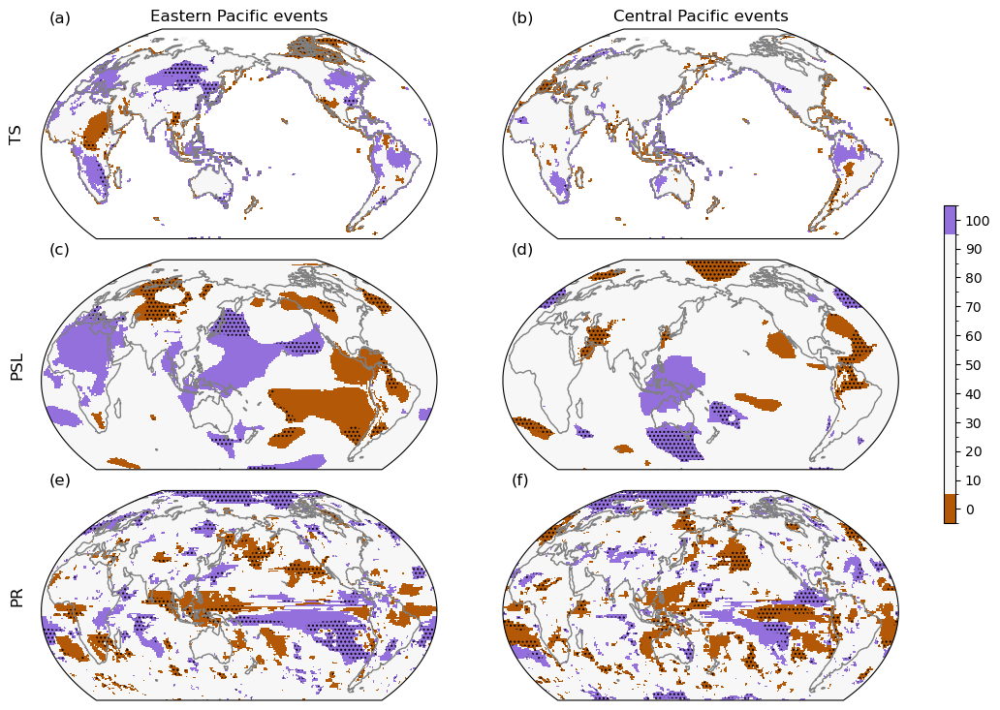

In [71]:
# merge TS, PSL, PRECIP together
sublabel = ['(a)','(b)','(c)','(d)','(e)','(f)','(g)','(h)','(i)','(j)','(k)','(l)','(m)','(n)','(o)','(p)','(q)','(r)','(s)','(t)','(u)','(v)','(w)','(x)','(y)','(z)']
color_ranking_full = ['saddlebrown', '#b35806', '#f1a340','#fee0b6', '#f7f7f7', '#f7f7f7', '#f7f7f7', '#d8daeb', '#998ec3', 'mediumpurple', 'rebeccapurple']
color_ranking_tail = ['#b35806', '#f7f7f7','#f7f7f7','#f7f7f7','#f7f7f7', '#f7f7f7', '#f7f7f7', '#f7f7f7','#f7f7f7','#f7f7f7','mediumpurple']


fig, axes = plt.subplots(3,2, figsize=(12,9),subplot_kw=dict(projection = WinkelTripel(central_longitude = -200)))

# ------------------------------TS + PSL + PRECIP------------------------------------------
for i in range(2):
    percentile = TS_percentile_nino34[i].where(~np.isnan(TS_berk_djf_composites_nino34[i])).plot.pcolormesh(ax=axes[0,i],levels=np.arange(-5,106,10),colors=color_ranking_tail,transform=ccrs.PlateCarree(),add_colorbar=False) 
    percentile = PSL_percentile_nino34[i].where(~np.isnan(PSL_era5_djf_composites_nino34[i])).plot.pcolormesh(ax=axes[1,i],levels=np.arange(-5,106,10),colors=color_ranking_tail,transform=ccrs.PlateCarree(),add_colorbar=False) 
    percentile = PRECIP_percentile_nino34[i].where(~np.isnan(PRECIP_gpcp_djf_composites_nino34[i])).plot.pcolormesh(ax=axes[2,i],levels=np.arange(-5,106,10),colors=color_ranking_tail,transform=ccrs.PlateCarree(),add_colorbar=False) 
    axes[0,i].contourf(TS_sign_match[i].lon, TS_sign_match[i].lat, TS_sign_match[i].where(~np.isnan(TS_berk_djf_composites_nino34[i])).where((TS_percentile_nino34[i] > 95) | (TS_percentile_nino34[i] < 5)), levels = [0,0.99], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    axes[1,i].contourf(PSL_sign_match[i].lon, PSL_sign_match[i].lat, PSL_sign_match[i].where(~np.isnan(PSL_era5_djf_composites_nino34[i])).where((PSL_percentile_nino34[i] > 95) | (PSL_percentile_nino34[i] < 5)), levels = [0,0.99], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    axes[2,i].contourf(PRECIP_sign_match[i].lon, PRECIP_sign_match[i].lat, PRECIP_sign_match[i].where(~np.isnan(PRECIP_gpcp_djf_composites_nino34[i])).where((PRECIP_percentile_nino34[i] > 95) | (PRECIP_percentile_nino34[i] < 5)), levels = [0,0.99], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
# -------------------------------Universal--------------------------------------------
for i in range(3):
    for j in range(2):
        axes[i,j].coastlines(color='grey')
        axes[i,j].annotate(sublabel[2*i+j], xy=(0.02, 1.03), xycoords='axes fraction', fontsize=12)
        axes[i,j].set_extent([-19.99, 339.99, -57, 90], crs=ccrs.PlateCarree())

# subtitles
axes[0, 0].set_title('Eastern Pacific events')
axes[0, 1].set_title('Central Pacific events')
axes[0, 0].annotate('TS', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=12, rotation = 'vertical', verticalalignment='center')
axes[1, 0].annotate('PSL', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=12, rotation = 'vertical', verticalalignment='center')
axes[2, 0].annotate('PR', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=12, rotation = 'vertical', verticalalignment='center')


cax = plt.axes([0.92, 0.313, 0.010, 0.365]) #[left, bottom, width, height]
plt.colorbar(percentile,cax=cax,orientation='vertical', ticks = np.arange(0, 101, 10))
# cax.set_yticks(np.linspace(0,100,11))

# plt.suptitle('Percentile of Observation in ERSST-TOGA', fontsize = 14)
plt.subplots_adjust(wspace=0.05,hspace=0.1)
plt.show()

### DJF mean of TS, PSL, and PRECIP

In [77]:
# DJF composites
SST_ersst_djf_composites = [SST_ersst_djf[i].mean(dim = ['time']) for i in range(2)]
TS_berk_djf_composites = [TS_berk_djf[i].mean(dim = ['time']) for i in range(2)]
TS_ersst_djf_composites = [TS_ersst_djf[i].mean(dim = ['time', 'ens_number']) for i in range(2)]
TS_LIM_djf_composites = [TS_LIM_djf[i].mean(dim = ['time', 'ens_number']) for i in range(2)]

PSL_era5_djf_composites = [PSL_era5_djf[i].mean(dim = ['time']) for i in range(2)]
PSL_ersst_djf_composites = [PSL_ersst_djf[i].mean(dim = ['time', 'ens_number']) for i in range(2)]
PSL_LIM_djf_composites = [PSL_LIM_djf[i].mean(dim = ['time', 'ens_number']) for i in range(2)]

PRECIP_gpcp_djf_composites = [PRECIP_gpcp_djf[i].mean(dim = ['time']) for i in range(2)]
PRECIP_ersst_djf_composites = [PRECIP_ersst_djf[i].mean(dim = ['time', 'ens_number']) for i in range(2)]
PRECIP_LIM_djf_composites = [PRECIP_LIM_djf[i].mean(dim = ['time', 'ens_number']) for i in range(2)]

### Variance of the composites

#### 1) Variance for all event and ens_number

In [79]:
# var over all events and ens_number
SST_ersst_djf_var_event_and_ens = [SST_ersst_djf[i].var(dim = ['time']) for i in range(2)]
TS_berk_djf_var_event_and_ens = [TS_berk_djf[i].var(dim = ['time']) for i in range(2)]
TS_ersst_djf_var_event_and_ens = [TS_ersst_djf[i].var(dim = ['time', 'ens_number']) for i in range(2)]
TS_LIM_djf_var_event_and_ens = [TS_LIM_djf[i].var(dim = ['time', 'ens_number']) for i in range(2)]
TS_LminusE_djf_var_event_and_ens = [(TS_LIM_djf[i] - TS_ersst_djf[i]).var(dim = ['time', 'ens_number']) for i in range(2)]

PSL_era5_djf_var_event_and_ens = [PSL_era5_djf[i].var(dim = ['time']) for i in range(2)]
PSL_ersst_djf_var_event_and_ens = [PSL_ersst_djf[i].var(dim = ['time', 'ens_number']) for i in range(2)]
PSL_LIM_djf_var_event_and_ens = [PSL_LIM_djf[i].var(dim = ['time', 'ens_number']) for i in range(2)]
PSL_LminusE_djf_var_event_and_ens = [(PSL_LIM_djf[i] - PSL_ersst_djf[i]).var(dim = ['time', 'ens_number']) for i in range(2)]

PRECIP_gpcp_djf_var_event_and_ens = [PRECIP_gpcp_djf[i].var(dim = ['time']) for i in range(2)]
PRECIP_ersst_djf_var_event_and_ens = [PRECIP_ersst_djf[i].var(dim = ['time', 'ens_number']) for i in range(2)]
PRECIP_LIM_djf_var_event_and_ens = [PRECIP_LIM_djf[i].var(dim = ['time', 'ens_number']) for i in range(2)]
PRECIP_LminusE_djf_var_event_and_ens = [(PRECIP_LIM_djf[i] - PRECIP_ersst_djf[i]).var(dim = ['time', 'ens_number']) for i in range(2)]

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/nputils.py:208: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/nputils.py:208: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/nputils.py:208: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/nputils.py:208: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xar

#### 2) Variance over events of ensemble mean (var caused by ENSO); mean over 'ens_number', var over 'time'

In [81]:
# var over events (after mean over ens_number)
TS_ersst_djf_var_event_of_ens_mean = [TS_ersst_djf[i].mean(dim = ['ens_number']).var(dim = ['time']) for i in range(2)]
TS_LIM_djf_var_event_of_ens_mean = [TS_LIM_djf[i].mean(dim = ['ens_number']).var(dim = ['time']) for i in range(2)]

PSL_ersst_djf_var_event_of_ens_mean = [PSL_ersst_djf[i].mean(dim = ['ens_number']).var(dim = ['time']) for i in range(2)]
PSL_LIM_djf_var_event_of_ens_mean = [PSL_LIM_djf[i].mean(dim = ['ens_number']).var(dim = ['time']) for i in range(2)]

PRECIP_ersst_djf_var_event_of_ens_mean = [PRECIP_ersst_djf[i].mean(dim = ['ens_number']).var(dim = ['time']) for i in range(2)]
PRECIP_LIM_djf_var_event_of_ens_mean = [PRECIP_LIM_djf[i].mean(dim = ['ens_number']).var(dim = ['time']) for i in range(2)]

#### 3) Variance over ensemble member of mean events (var caused by internal atmospheric variability); mean over 'time', var over 'ens_number'

In [83]:
# var over events (after mean over ens_number)
TS_ersst_djf_var_ens_of_event_mean = [TS_ersst_djf[i].mean(dim = ['time']).var(dim = ['ens_number']) for i in range(2)]
TS_LIM_djf_var_ens_of_event_mean = [TS_LIM_djf[i].mean(dim = ['time']).var(dim = ['ens_number']) for i in range(2)]

PSL_ersst_djf_var_ens_of_event_mean = [PSL_ersst_djf[i].mean(dim = ['time']).var(dim = ['ens_number']) for i in range(2)]
PSL_LIM_djf_var_ens_of_event_mean = [PSL_LIM_djf[i].mean(dim = ['time']).var(dim = ['ens_number']) for i in range(2)]

PRECIP_ersst_djf_var_ens_of_event_mean = [PRECIP_ersst_djf[i].mean(dim = ['time']).var(dim = ['ens_number']) for i in range(2)]
PRECIP_LIM_djf_var_ens_of_event_mean = [PRECIP_LIM_djf[i].mean(dim = ['time']).var(dim = ['ens_number']) for i in range(2)]

### Mask out region for signal to noise ratio < 1.0

In [85]:
# Mask using signal to noise ratio
SST_ersst_djf_composites_mask = [abs(SST_ersst_djf_composites[i] / np.sqrt(SST_ersst_djf_var_event_and_ens[i])) > 1 for i in [0,1]]
TS_berk_djf_composites_mask = [abs(TS_berk_djf_composites[i] / np.sqrt(TS_berk_djf_var_event_and_ens[i])) > 1 for i in [0,1]]
TS_ersst_djf_composites_mask = [abs(TS_ersst_djf_composites[i] / np.sqrt(TS_ersst_djf_var_event_and_ens[i])) > 1 for i in [0,1]]
TS_LIM_djf_composites_mask = [abs(TS_LIM_djf_composites[i] / np.sqrt(TS_LIM_djf_var_event_and_ens[i])) > 1 for i in [0,1]]
# TS_LminusE_djf_composites_mask = [abs((TS_LIM_djf_composites[i] - TS_ersst_djf_composites[i]) / np.sqrt(TS_LminusE_djf_var_event_and_ens[i])) > 1 for i in [0,1]]
TS_LminusE_djf_composites_mask = [two_sample_diff_ttest(TS_LIM_djf[i]/TS_LIM_nino34_djf[i], TS_ersst_djf[i]/TS_ersst_nino34_djf[i], axis = [0,3]) < 0.1 for i in [0,1]]

PSL_era5_djf_composites_mask = [abs(PSL_era5_djf_composites[i] / np.sqrt(PSL_era5_djf_var_event_and_ens[i])) > 1 for i in [0,1]]
PSL_ersst_djf_composites_mask = [abs(PSL_ersst_djf_composites[i] / np.sqrt(PSL_ersst_djf_var_event_and_ens[i])) > 1 for i in [0,1]]
PSL_LIM_djf_composites_mask = [abs(PSL_LIM_djf_composites[i] / np.sqrt(PSL_LIM_djf_var_event_and_ens[i])) > 1 for i in [0,1]]
# PSL_LminusE_djf_composites_mask = [abs((PSL_LIM_djf_composites[i] - PSL_ersst_djf_composites[i]) / np.sqrt(PSL_LminusE_djf_var_event_and_ens[i])) > 1 for i in [0,1]]
PSL_LminusE_djf_composites_mask = [two_sample_diff_ttest(PSL_LIM_djf[i]/TS_LIM_nino34_djf[i], PSL_ersst_djf[i]/TS_ersst_nino34_djf[i], axis = [0,3]) < 0.1 for i in [0,1]]

PRECIP_gpcp_djf_composites_mask = [abs(PRECIP_gpcp_djf_composites[i] / np.sqrt(PRECIP_gpcp_djf_var_event_and_ens[i])) > 1 for i in [0,1]]
PRECIP_ersst_djf_composites_mask = [abs(PRECIP_ersst_djf_composites[i] / np.sqrt(PRECIP_ersst_djf_var_event_and_ens[i])) > 1 for i in [0,1]]
PRECIP_LIM_djf_composites_mask = [abs(PRECIP_LIM_djf_composites[i] / np.sqrt(PRECIP_LIM_djf_var_event_and_ens[i])) > 1 for i in [0,1]]
# PRECIP_LminusE_djf_composites_mask = [abs((PRECIP_LIM_djf_composites[i] - PRECIP_ersst_djf_composites[i]) / np.sqrt(PRECIP_LminusE_djf_var_event_and_ens[i])) > 1 for i in [0,1]]
PRECIP_LminusE_djf_composites_mask = [two_sample_diff_ttest(PRECIP_LIM_djf[i]/TS_LIM_nino34_djf[i], PRECIP_ersst_djf[i]/TS_ersst_nino34_djf[i], axis = [0,3]) < 0.1 for i in [0,1]]

### Plotting functions

In [87]:
# Three panels
def plot_djf_composites_EN_TS_PSL(TS_composites_djf, PSL_composites_djf, ENSO_year, TS_diff_ttest, PSL_diff_ttest, nino34 = [1,1], TS_mask = None, PSL_mask = None, SST_composites_djf = None, SST_mask = None, SST_diff_ttest = None):
    # Calculate composite differences
    if SST_composites_djf != None:
        SST_composites_CPEP_diff = SST_composites_djf[1]/nino34[1] - SST_composites_djf[0]/nino34[0]
    TS_composites_CPEP_diff = TS_composites_djf[1]/nino34[1] - TS_composites_djf[0]/nino34[0]
    PSL_composites_CPEP_diff = PSL_composites_djf[1]/nino34[1] - PSL_composites_djf[0]/nino34[0]

    # Plotting
    levels = np.linspace(-2,2,21)
    fig, axes = plt.subplots(1,3, figsize=(18,3),subplot_kw=dict(projection=ccrs.PlateCarree(central_longitude=180)))
    for i in range(2):
        ax = axes[i]
        if SST_composites_djf != None:
            SST = (SST_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
            ax.contourf(SST_mask[i].lon+180, SST_mask[i].lat, SST_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0)
            SST_diff = SST_composites_CPEP_diff.plot.contourf(ax=axes[2],levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
            axes[2].contourf(SST_diff_ttest.lon+180, SST_diff_ttest.lat, SST_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0)
    
        TS = (TS_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
        PSL = (PSL_composites_djf[i]/nino34[i]).plot.contour(ax=ax,colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
        PSL = (PSL_composites_djf[i]/nino34[i]).where(PSL_mask[i]).plot.contour(ax=ax,colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
        plt.clabel(PSL, inline=True, fontsize=8)
        ax.coastlines(color='grey')
        ax.annotate('n = {}'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
        ax.contourf(TS_mask[i].lon+180, TS_mask[i].lat, TS_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0)
        ax.set_extent([0, 360, -60, 90], crs=ccrs.PlateCarree())
       
    axes[0].set_title('Eastern Pacific events')
    axes[1].set_title('Central Pacific events')
            
    TS_diff = TS_composites_CPEP_diff.plot.contourf(ax=axes[2],levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
    axes[2].contourf(TS_diff_ttest.lon-180, TS_diff_ttest.lat, TS_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0)
    PSL_diff = PSL_composites_CPEP_diff.plot.contour(ax=axes[2],colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())
    PSL_diff = PSL_composites_CPEP_diff.where(PSL_diff_ttest<0.1).plot.contour(ax=axes[2],colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())
    plt.clabel(PSL_diff, inline=True, fontsize=8)
    axes[2].coastlines(color='grey')
    axes[2].set_title('CP - EP')
    axes[2].set_extent([0, 360, -60, 90], crs=ccrs.PlateCarree())
    
    cax = plt.axes([0.91, 0.213, 0.010, 0.565]) #[left, bottom, width, height]
    plt.colorbar(TS,cax=cax,orientation='vertical')
    cax.set_yticks(levels[::2])
    
    plt.subplots_adjust(wspace=0.1,hspace=0.2)

In [88]:
# Three panels
def plot_djf_composites_EN_PRECIP(PRECIP_composites_djf, ENSO_year, PRECIP_diff_ttest, nino34 = [1,1], PRECIP_mask = None):
    # Calculate composite differences
    PRECIP_composites_CPEP_diff = PRECIP_composites_djf[1]/nino34[1] - PRECIP_composites_djf[0]/nino34[0]

    levels = np.linspace(-60,60,25)
    fig, axes = plt.subplots(1,3, figsize=(18,3),subplot_kw=dict(projection=ccrs.PlateCarree(central_longitude=180)))
    for i in range(2):
        ax = axes[i]
        PRECIP = (PRECIP_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
        ax.coastlines(color='grey')
        ax.annotate('n = {}'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
        ax.contourf(PRECIP_mask[i].lon+180, PRECIP_mask[i].lat, PRECIP_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0)
        ax.set_extent([0, 360, -60, 90], crs=ccrs.PlateCarree())
        
    axes[0].set_title('Eastern Pacific events')
    axes[1].set_title('Central Pacific events')

    PRECIP_diff = PRECIP_composites_CPEP_diff.plot.contourf(ax=axes[2],levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    axes[2].contourf(PRECIP_diff_ttest.lon-180, PRECIP_diff_ttest.lat, PRECIP_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0)
    axes[2].coastlines(color='grey')
    axes[2].set_title('CP - EP')
    axes[2].set_extent([0, 360, -60, 90], crs=ccrs.PlateCarree())
    
    cax = plt.axes([0.91, 0.213, 0.010, 0.565]) #[left, bottom, width, height]
    plt.colorbar(PRECIP,cax=cax,orientation='vertical')
    cax.set_yticks(levels[::4])
    
    plt.subplots_adjust(wspace=0.1,hspace=0.2)

### Composites

### Bootstrapping of different maps

In [102]:
# Corresponding Nino3.4: SST_ersst_nino34_djf_all and TS_LIM_nino34_djf_all
# Corresponding TS, PSL and PR composites: SST_ersst_djf, TS_berk_djf, TS_ersst_djf, TS_LIM_djf, PSL_era5_djf, PSL_ersst_djf, PSL_LIM_djf, PRECIP_gpcp_djf, PRECIP_ersst_djf, PRECIP_LIM_djf

# TOGA: stack the 'time' and 'ens_number' dimensions as 'event'
# stack order: (time 1, ens 1), (time 1, ens 2), ..., (time 1, ens 10), ... (time 2, ens 1), (time 2, ens 2), ... (time 5, ens 10)
TS_ersst_djf_event = [TS_ersst_djf[i].stack(event=("time", "ens_number")) for i in range(2)]
TS_LIM_djf_event = [TS_LIM_djf[i].stack(event=("time", "ens_number")) for i in range(2)]
PSL_ersst_djf_event = [PSL_ersst_djf[i].stack(event=("time", "ens_number")) for i in range(2)]
PSL_LIM_djf_event = [PSL_LIM_djf[i].stack(event=("time", "ens_number")) for i in range(2)]
PRECIP_ersst_djf_event = [PRECIP_ersst_djf[i].stack(event=("time", "ens_number")) for i in range(2)]
PRECIP_LIM_djf_event = [PRECIP_LIM_djf[i].stack(event=("time", "ens_number")) for i in range(2)]

# Ready for bootstrapping

In [103]:
def bootstrap_CP_EP_diff(ds_event, nino34, seed, bs_size = 30):
    """
    Perform bootstrapping with replacement to generate multiple difference maps.
    
    Parameters:
    ds_event (list of xr.Dataset): TS/PSL/PR djf events, 0 = EP, 1 = CP.
    nino34 (list of np.ndarray): Corresponding nino3.4 values.
    bs_size (int): The number of bootstrap iterations.
    seed (int): Random seed for reproducibility.
    
    Returns:
    xr.DataArray: An xarray DataArray storing 30 different difference maps.
    """
    
    np.random.seed(seed)
    diff_maps = []

    for _ in range(bs_size):
        #------EP---------
        # Get the bootstrapping indices with replacement, n = 50
        indices_EP = np.random.choice(ds_event[0]['event'].size, size=50, replace=True)
        # Find the nino3.4 values for the corresponding 50 selected events
        bs_nino34_EP = nino34[0][indices_EP // 10]
        # Find the TS/PSL/PR of the corresponding 50 selected events
        bs_EP = ds_event[0].isel({'event': indices_EP})
        # Scaled composites of the 50 selected events
        bs_scaled_EP = bs_EP.mean(dim = 'event') / np.mean(bs_nino34_EP)
    
        #------CP---------
        # Get the bootstrapping indices with replacement, n = 50
        indices_CP = np.random.choice(ds_event[1]['event'].size, size=50, replace=True)
        # Find the nino3.4 values for the corresponding 50 selected events
        bs_nino34_CP = nino34[1][indices_CP // 10]
        # Find the TS/PSL/PR of the corresponding 50 selected events
        bs_CP = ds_event[1].isel({'event': indices_CP})
        # Scaled composites of the 50 selected events
        bs_scaled_CP = bs_CP.mean(dim = 'event') / np.mean(bs_nino34_CP)

        # Store the difference map
        diff_maps.append(bs_scaled_CP - bs_scaled_EP)
    
    # Convert list to xarray DataArray
    diff_maps_da = xr.concat(diff_maps, dim='bootstrap')
    diff_maps_da = diff_maps_da.assign_coords(bootstrap=np.arange(bs_size))
    
    return diff_maps_da

In [104]:
# Apply the above function
TS_ersst_djf_CPEP_diff_bootstrap = bootstrap_CP_EP_diff(TS_ersst_djf_event, SST_ersst_nino34_djf_all, 111)
TS_LIM_djf_CPEP_diff_bootstrap = bootstrap_CP_EP_diff(TS_LIM_djf_event, TS_LIM_nino34_djf_all, 112)
PSL_ersst_djf_CPEP_diff_bootstrap = bootstrap_CP_EP_diff(PSL_ersst_djf_event, SST_ersst_nino34_djf_all, 113)
PSL_LIM_djf_CPEP_diff_bootstrap = bootstrap_CP_EP_diff(PSL_LIM_djf_event, TS_LIM_nino34_djf_all, 114)
PRECIP_ersst_djf_CPEP_diff_bootstrap = bootstrap_CP_EP_diff(PRECIP_ersst_djf_event, SST_ersst_nino34_djf_all, 115)
PRECIP_LIM_djf_CPEP_diff_bootstrap = bootstrap_CP_EP_diff(PRECIP_LIM_djf_event, TS_LIM_nino34_djf_all, 116)

In [105]:
# t test of the bootstrapped 
TS_djf_CPEP_diff_LIMersst_diff_ttest = two_sample_diff_ttest(TS_ersst_djf_CPEP_diff_bootstrap, TS_LIM_djf_CPEP_diff_bootstrap, axis=[0])
PSL_djf_CPEP_diff_LIMersst_diff_ttest = two_sample_diff_ttest(PSL_ersst_djf_CPEP_diff_bootstrap, PSL_LIM_djf_CPEP_diff_bootstrap, axis=[0])
PRECIP_djf_CPEP_diff_LIMersst_diff_ttest = two_sample_diff_ttest(PRECIP_ersst_djf_CPEP_diff_bootstrap, PRECIP_LIM_djf_CPEP_diff_bootstrap, axis=[0])

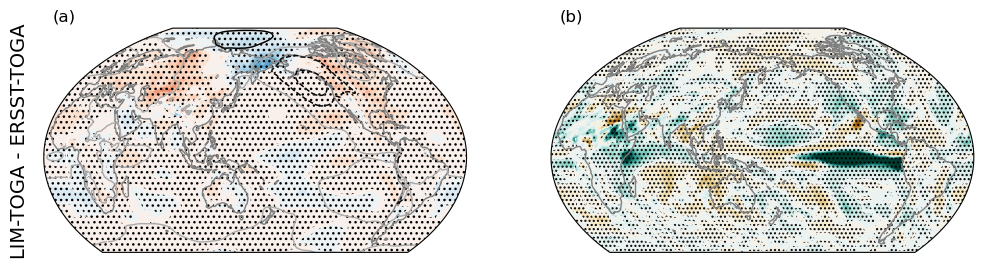

In [106]:
# Plot the difference maps

fig, axes = plt.subplots(1,2, figsize=(12, 4),subplot_kw=dict(projection=WinkelTripel(central_longitude = -200)))

# ------TS and PSL----------------LIM-TOGA - ERSST-TOGA--------------------------------------

TS_E_composites_djf = TS_ersst_djf_CPEP_diff_bootstrap.mean(dim = 'bootstrap')
PSL_E_composites_djf = PSL_ersst_djf_CPEP_diff_bootstrap.mean(dim = 'bootstrap')

TS_L_composites_djf = TS_LIM_djf_CPEP_diff_bootstrap.mean(dim = 'bootstrap')
PSL_L_composites_djf = PSL_LIM_djf_CPEP_diff_bootstrap.mean(dim = 'bootstrap')

TS_diff_ttest = TS_djf_CPEP_diff_LIMersst_diff_ttest
PSL_diff_ttest = PSL_djf_CPEP_diff_LIMersst_diff_ttest

# Calculate composite differences
TS_composites_CPEP_diff = TS_L_composites_djf - TS_E_composites_djf
PSL_composites_CPEP_diff = PSL_L_composites_djf - PSL_E_composites_djf
  
TS_diff = TS_composites_CPEP_diff.plot.contourf(ax=axes[0],levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[0].contourf(TS_diff_ttest.lon, TS_diff_ttest.lat, TS_diff_ttest, levels = [0.0,0.10], hatches=['...'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.plot.contour(ax=axes[0],colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.where(PSL_diff_ttest<0.1).plot.contour(ax=axes[0],colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())

# ------PRECIP----------------LIM-TOGA - ERSST-TOGA--------------------------------------

PRECIP_E_composites_djf = PRECIP_ersst_djf_CPEP_diff_bootstrap.mean(dim = 'bootstrap')

PRECIP_L_composites_djf = PRECIP_LIM_djf_CPEP_diff_bootstrap.mean(dim = 'bootstrap')

PRECIP_diff_ttest = PRECIP_djf_CPEP_diff_LIMersst_diff_ttest

# Calculate composite differences
PRECIP_composites_CPEP_diff = PRECIP_L_composites_djf - PRECIP_E_composites_djf

PRECIP_diff = PRECIP_composites_CPEP_diff.plot.contourf(ax=axes[1],levels=np.linspace(-60,60,25),cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[1].contourf(PRECIP_diff_ttest.lon, PRECIP_diff_ttest.lat, PRECIP_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())

# ----------------------------Universal--------------------------------------
for i in range(2):
        axes[i].coastlines(color='grey')
        axes[i].annotate(sublabel[i], xy=(0.02, 1.03), xycoords='axes fraction', fontsize=12)
        axes[i].set_extent([-19.99, 339.99, -57, 90], crs=ccrs.PlateCarree())
    
axes[0].annotate('LIM-TOGA - ERSST-TOGA', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')

plt.show()

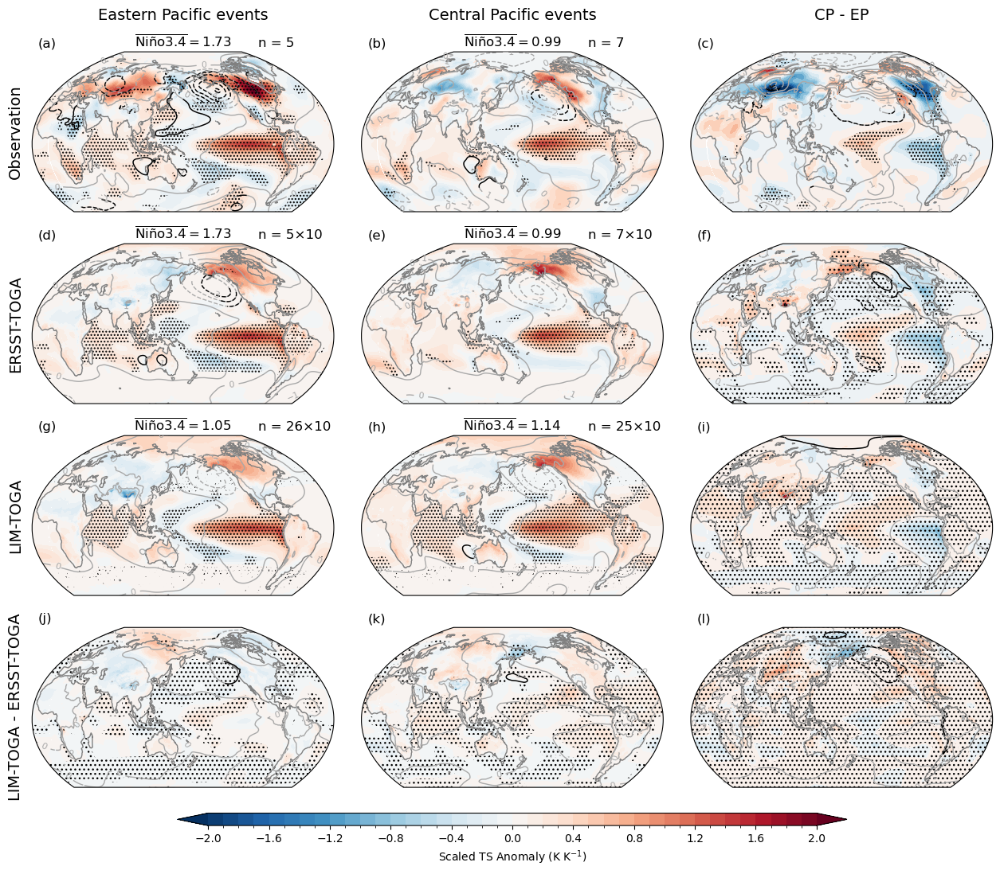

In [150]:
# 9 panels TS & PSL

# ---------------------------Universal----------------------------
levels = np.linspace(-2,2,41)
sublabel = ['(a)','(b)','(c)','(d)','(e)','(f)','(g)','(h)','(i)','(j)','(k)','(l)','(m)','(n)','(o)','(p)','(q)','(r)','(s)','(t)','(u)','(v)','(w)','(x)','(y)','(z)']

# ---------------------------Observation----------------------------

TS_composites_djf = TS_berk_djf_composites
PSL_composites_djf = PSL_era5_djf_composites
ENSO_year = TS_ersst_EPCP
TS_diff_ttest = TS_berk_djf_CPEP_diff_ttest_nino34
PSL_diff_ttest = PSL_era5_djf_CPEP_diff_ttest_nino34
nino34 = SST_ersst_nino34_djf
TS_mask = TS_berk_djf_composites_mask
PSL_mask = PSL_era5_djf_composites_mask
SST_composites_djf = SST_ersst_djf_composites
SST_mask = SST_ersst_djf_composites_mask
SST_diff_ttest = SST_ersst_djf_CPEP_diff_ttest_nino34

# Calculate composite differences
SST_composites_CPEP_diff = SST_composites_djf[1]/nino34[1] - SST_composites_djf[0]/nino34[0]
TS_composites_CPEP_diff = TS_composites_djf[1]/nino34[1] - TS_composites_djf[0]/nino34[0]
PSL_composites_CPEP_diff = PSL_composites_djf[1]/nino34[1] - PSL_composites_djf[0]/nino34[0]

# Plotting
fig, axes = plt.subplots(4,3, figsize=(16,12),subplot_kw=dict(projection=WinkelTripel(central_longitude = -200)))
for i in range(2):
    ax = axes[0, i]
    SST = (SST_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    ax.contourf(SST_mask[i].lon, SST_mask[i].lat, SST_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    SST_diff = SST_composites_CPEP_diff.plot.contourf(ax=axes[0, 2],levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    axes[0,2].contourf(SST_diff_ttest.lon, SST_diff_ttest.lat, SST_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
    TS = (TS_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    PSL = (PSL_composites_djf[i]/nino34[i]).plot.contour(ax=ax,colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    plt.clabel(PSL, inline=True, fontsize=8)
    PSL = (PSL_composites_djf[i]/nino34[i]).where(PSL_mask[i]).plot.contour(ax=ax,colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    ax.annotate(rf'$\overline{{\mathrm{{Niño3.4}}}} = {np.round(nino34[i], 2)}$', xy=(0.5, 1.03), xycoords='axes fraction', fontsize=12, horizontalalignment='center')
    ax.annotate('n = {}'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
    ax.contourf(TS_mask[i].lon, TS_mask[i].lat, TS_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
TS_diff = TS_composites_CPEP_diff.plot.contourf(ax=axes[0,2],levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[0,2].contourf(TS_diff_ttest.lon, TS_diff_ttest.lat, TS_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.plot.contour(ax=axes[0,2],colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())
plt.clabel(PSL_diff, inline=True, fontsize=8)
PSL_diff = PSL_composites_CPEP_diff.where(PSL_diff_ttest<0.1).plot.contour(ax=axes[0,2],colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())

# ----------------------------ERSST-TOGA--------------------------------------

TS_composites_djf = TS_ersst_djf_composites
PSL_composites_djf = PSL_ersst_djf_composites
ENSO_year = TS_ersst_EPCP
TS_diff_ttest = TS_ersst_djf_CPEP_diff_ttest_nino34
PSL_diff_ttest = PSL_ersst_djf_CPEP_diff_ttest_nino34
nino34 = TS_ersst_nino34_djf
TS_mask = TS_ersst_djf_composites_mask
PSL_mask = PSL_ersst_djf_composites_mask

# Calculate composite differences
TS_composites_CPEP_diff = TS_composites_djf[1]/nino34[1] - TS_composites_djf[0]/nino34[0]
PSL_composites_CPEP_diff = PSL_composites_djf[1]/nino34[1] - PSL_composites_djf[0]/nino34[0]

for i in range(2):
    ax = axes[1, i]
    TS = (TS_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    PSL = (PSL_composites_djf[i]/nino34[i]).plot.contour(ax=ax,colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    plt.clabel(PSL, inline=True, fontsize=8)
    PSL = (PSL_composites_djf[i]/nino34[i]).where(PSL_mask[i]).plot.contour(ax=ax,colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    ax.annotate(rf'$\overline{{\mathrm{{Niño3.4}}}} = {np.round(nino34[i], 2)}$', xy=(0.5, 1.03), xycoords='axes fraction', fontsize=12, horizontalalignment='center')
    ax.annotate('n = {}×10'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
    ax.contourf(TS_mask[i].lon, TS_mask[i].lat, TS_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
TS_diff = TS_composites_CPEP_diff.plot.contourf(ax=axes[1,2],levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[1,2].contourf(TS_diff_ttest.lon, TS_diff_ttest.lat, TS_diff_ttest, levels = [0.0,0.10], hatches=['...'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.plot.contour(ax=axes[1,2],colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())
plt.clabel(PSL_diff, inline=True, fontsize=8)
PSL_diff = PSL_composites_CPEP_diff.where(PSL_diff_ttest<0.1).plot.contour(ax=axes[1,2],colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())

# ----------------------------LIM-TOGA--------------------------------------

TS_composites_djf = TS_LIM_djf_composites
PSL_composites_djf = PSL_LIM_djf_composites
ENSO_year = TS_LIM_EPCP
TS_diff_ttest = TS_LIM_djf_CPEP_diff_ttest_nino34
PSL_diff_ttest = PSL_LIM_djf_CPEP_diff_ttest_nino34
nino34 = TS_LIM_nino34_djf
TS_mask = TS_LIM_djf_composites_mask
PSL_mask = PSL_LIM_djf_composites_mask

# Calculate composite differences
TS_composites_CPEP_diff = TS_composites_djf[1]/nino34[1] - TS_composites_djf[0]/nino34[0]
PSL_composites_CPEP_diff = PSL_composites_djf[1]/nino34[1] - PSL_composites_djf[0]/nino34[0]

for i in range(2):
    ax = axes[2, i]
    TS = (TS_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    PSL = (PSL_composites_djf[i]/nino34[i]).plot.contour(ax=ax,colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    plt.clabel(PSL, inline=True, fontsize=8)
    PSL = (PSL_composites_djf[i]/nino34[i]).where(PSL_mask[i]).plot.contour(ax=ax,colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    ax.annotate(rf'$\overline{{\mathrm{{Niño3.4}}}} = {np.round(nino34[i], 2)}$', xy=(0.5, 1.03), xycoords='axes fraction', fontsize=12, horizontalalignment='center')
    ax.annotate('n = {}×10'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
    ax.contourf(TS_mask[i].lon, TS_mask[i].lat, TS_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
TS_diff = TS_composites_CPEP_diff.plot.contourf(ax=axes[2,2],levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[2,2].contourf(TS_diff_ttest.lon, TS_diff_ttest.lat, TS_diff_ttest, levels = [0.0,0.10], hatches=['...'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.plot.contour(ax=axes[2,2],colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())
plt.clabel(PSL_diff, inline=True, fontsize=8)
PSL_diff = PSL_composites_CPEP_diff.where(PSL_diff_ttest<0.1).plot.contour(ax=axes[2,2],colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())

# ----------------------LIM-TOGA - ERSST-TOGA--------------------------------------

TS_E_composites_djf = TS_ersst_djf_composites
PSL_E_composites_djf = PSL_ersst_djf_composites
nino34_E = TS_ersst_nino34_djf

TS_L_composites_djf = TS_LIM_djf_composites
PSL_L_composites_djf = PSL_LIM_djf_composites
nino34_L = TS_LIM_nino34_djf

TS_diff_ttest = TS_LminusE_djf_CPEP_diff_ttest_nino34
PSL_diff_ttest = PSL_LminusE_djf_CPEP_diff_ttest_nino34
TS_mask = TS_LminusE_djf_composites_mask
PSL_mask = PSL_LminusE_djf_composites_mask

for i in range(2):
    ax = axes[3, i]
    TS = (TS_L_composites_djf[i]/nino34_L[i] - TS_E_composites_djf[i]/nino34_E[i]).plot.contourf(ax=ax,levels=levels,cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    PSL = (PSL_L_composites_djf[i]/nino34_L[i] - PSL_E_composites_djf[i]/nino34_E[i]).plot.contour(ax=ax,colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    plt.clabel(PSL, inline=True, fontsize=8)
    PSL = (PSL_L_composites_djf[i]/nino34_L[i] - PSL_E_composites_djf[i]/nino34_E[i]).where(PSL_mask[i]).plot.contour(ax=ax,colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    ax.contourf(TS_mask[i].lon, TS_mask[i].lat, TS_mask[i], levels = [0.99,1.01], hatches=['...'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())

#### ------TS and PSL----------------LIM-TOGA - ERSST-TOGA------------last panel--------------------------

TS_E_composites_djf = TS_ersst_djf_CPEP_diff_bootstrap.mean(dim = 'bootstrap')
PSL_E_composites_djf = PSL_ersst_djf_CPEP_diff_bootstrap.mean(dim = 'bootstrap')

TS_L_composites_djf = TS_LIM_djf_CPEP_diff_bootstrap.mean(dim = 'bootstrap')
PSL_L_composites_djf = PSL_LIM_djf_CPEP_diff_bootstrap.mean(dim = 'bootstrap')

TS_diff_ttest = TS_djf_CPEP_diff_LIMersst_diff_ttest
PSL_diff_ttest = PSL_djf_CPEP_diff_LIMersst_diff_ttest

# Calculate composite differences
TS_composites_CPEP_diff = TS_L_composites_djf - TS_E_composites_djf
PSL_composites_CPEP_diff = PSL_L_composites_djf - PSL_E_composites_djf

TS_diff = TS_composites_CPEP_diff.plot.contourf(ax=axes[3,2],levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[3,2].contourf(TS_diff_ttest.lon, TS_diff_ttest.lat, TS_diff_ttest, levels = [0.0,0.10], hatches=['...'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.plot.contour(ax=axes[3,2],colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())
plt.clabel(PSL_diff, inline=True, fontsize=8)
PSL_diff = PSL_composites_CPEP_diff.where(PSL_diff_ttest<0.1).plot.contour(ax=axes[3,2],colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())

# ----------------------------Universal--------------------------------------
for i in range(4):
    for j in range(3):
        axes[i,j].coastlines(color='grey')
        axes[i,j].annotate(sublabel[3*i+j], xy=(0.02, 1.03), xycoords='axes fraction', fontsize=12)
        axes[i,j].set_extent([-19.99, 339.99, -57, 90], crs=ccrs.PlateCarree())
    

# colorbar
cax = plt.axes([0.25, 0.07, 0.525, 0.013]) #[left, bottom, width, height]
cbar = plt.colorbar(TS,cax=cax,orientation='horizontal')
cax.set_xticks(np.linspace(-2,2,21)[::2])
cbar.set_label('Scaled TS Anomaly (K K$^{-1}$)')

# subtitles
axes[0, 0].annotate('Eastern Pacific events', xy=(0.5, 1.2), xycoords='axes fraction', fontsize=14, rotation = 'horizontal', horizontalalignment='center')
axes[0, 1].annotate('Central Pacific events', xy=(0.5, 1.2), xycoords='axes fraction', fontsize=14, rotation = 'horizontal', horizontalalignment='center')
axes[0, 2].annotate('CP - EP', xy=(0.5, 1.2), xycoords='axes fraction', fontsize=14, rotation = 'horizontal', horizontalalignment='center')
axes[0, 0].annotate('Observation', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')
axes[1, 0].annotate('ERSST-TOGA', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')
axes[2, 0].annotate('LIM-TOGA', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')
axes[3, 0].annotate('LIM-TOGA - ERSST-TOGA', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')

plt.subplots_adjust(wspace=0.0, hspace=0.2)
plt.show()

##### Sum of absolute differences of (c), (f) and (i)

In [108]:
# Sum of absolute diff in (c), (f) and (i) in TS (above)
sum_abs_diff_CP_EP_TS_obs = (abs(SST_ersst_djf_composites[1]/SST_ersst_nino34_djf[1] - SST_ersst_djf_composites[0]/SST_ersst_nino34_djf[0]).sum() + abs(TS_berk_djf_composites[1]/SST_ersst_nino34_djf[1] - TS_berk_djf_composites[0]/SST_ersst_nino34_djf[0]).sum()).values
sum_abs_diff_CP_EP_TS_ERSST = (abs(TS_ersst_djf_composites[1]/SST_ersst_nino34_djf[1] - TS_ersst_djf_composites[0]/SST_ersst_nino34_djf[0]).sum()).values
sum_abs_diff_CP_EP_TS_LIM = (abs(TS_LIM_djf_composites[1]/TS_LIM_nino34_djf[1] - TS_LIM_djf_composites[0]/TS_LIM_nino34_djf[0]).sum()).values

# Sum of absolute diff in (c), (f) and (i) in PSL (above)
sum_abs_diff_CP_EP_PSL_obs = (abs(PSL_era5_djf_composites[1]/SST_ersst_nino34_djf[1] - PSL_era5_djf_composites[0]/SST_ersst_nino34_djf[0]).sum()).values
sum_abs_diff_CP_EP_PSL_ERSST = (abs(PSL_ersst_djf_composites[1]/SST_ersst_nino34_djf[1] - PSL_ersst_djf_composites[0]/SST_ersst_nino34_djf[0]).sum()).values
sum_abs_diff_CP_EP_PSL_LIM = (abs(PSL_LIM_djf_composites[1]/TS_LIM_nino34_djf[1] - PSL_LIM_djf_composites[0]/TS_LIM_nino34_djf[0]).sum()).values

# Sum of absolute diff in (c), (f) and (i) in PR (below)
sum_abs_diff_CP_EP_PRECIP_obs = (abs(PRECIP_gpcp_djf_composites[1]/SST_ersst_nino34_djf[1] - PRECIP_gpcp_djf_composites[0]/SST_ersst_nino34_djf[0]).sum()).values
sum_abs_diff_CP_EP_PRECIP_ERSST = (abs(PRECIP_ersst_djf_composites[1]/SST_ersst_nino34_djf[1] - PRECIP_ersst_djf_composites[0]/SST_ersst_nino34_djf[0]).sum()).values
sum_abs_diff_CP_EP_PRECIP_LIM = (abs(PRECIP_LIM_djf_composites[1]/TS_LIM_nino34_djf[1] - PRECIP_LIM_djf_composites[0]/TS_LIM_nino34_djf[0]).sum()).values

In [109]:
print('The sum of abs CP-EP diff for TS obs is', sum_abs_diff_CP_EP_TS_obs)
print('The sum of abs CP-EP diff for TS ERSST-TOGA is', sum_abs_diff_CP_EP_TS_ERSST)
print('The sum of abs CP-EP diff for TS LIM-TOGA is', sum_abs_diff_CP_EP_TS_LIM,'\n')

print('The sum of abs CP-EP diff for PSL obs is', sum_abs_diff_CP_EP_PSL_obs)
print('The sum of abs CP-EP diff for PSL ERSST-TOGA is', sum_abs_diff_CP_EP_PSL_ERSST)
print('The sum of abs CP-EP diff for PSL LIM-TOGA is', sum_abs_diff_CP_EP_PSL_LIM,'\n')

print('The sum of abs CP-EP diff for PR obs is', sum_abs_diff_CP_EP_PRECIP_obs)
print('The sum of abs CP-EP diff for PR ERSST-TOGA is', sum_abs_diff_CP_EP_PRECIP_ERSST)
print('The sum of abs CP-EP diff for PR LIM-TOGA is', sum_abs_diff_CP_EP_PRECIP_LIM)

The sum of abs CP-EP diff for TS obs is 10355.922943798669
The sum of abs CP-EP diff for TS ERSST-TOGA is 6577.731489453741
The sum of abs CP-EP diff for TS LIM-TOGA is 5427.873161244683 

The sum of abs CP-EP diff for PSL obs is 35040.69955043348
The sum of abs CP-EP diff for PSL ERSST-TOGA is 19075.9222528786
The sum of abs CP-EP diff for PSL LIM-TOGA is 15945.867730201713 

The sum of abs CP-EP diff for PR obs is 975560.3506036407
The sum of abs CP-EP diff for PR ERSST-TOGA is 363486.86735183717
The sum of abs CP-EP diff for PR LIM-TOGA is 248862.5975481068


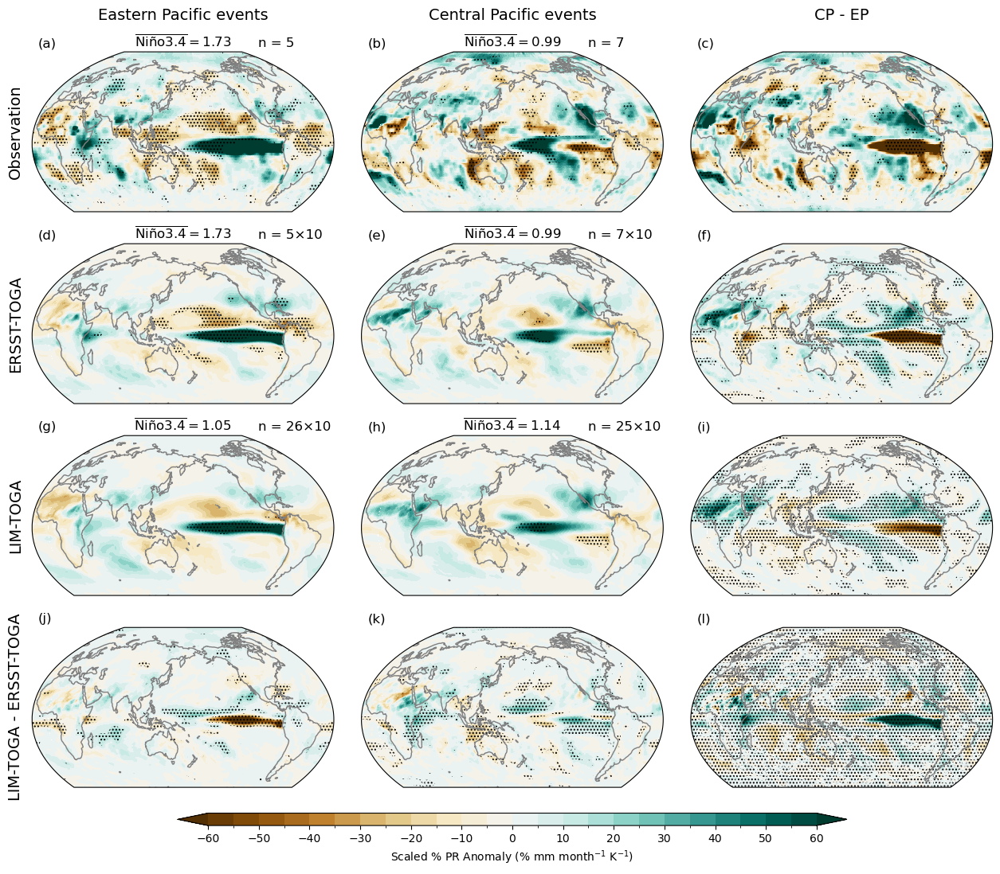

In [149]:
# 9 panels PRECIP

# ---------------------------Universal----------------------------
levels = np.linspace(-60,60,25)

# ---------------------------Observation----------------------------

PRECIP_composites_djf = PRECIP_gpcp_djf_composites
ENSO_year = TS_ersst_EPCP
PRECIP_diff_ttest = PRECIP_gpcp_djf_CPEP_diff_ttest_nino34
nino34 = SST_ersst_nino34_djf
PRECIP_mask = PRECIP_gpcp_djf_composites_mask

# Calculate composite differences
PRECIP_composites_CPEP_diff = PRECIP_composites_djf[1]/nino34[1] - PRECIP_composites_djf[0]/nino34[0]

# Plotting
fig, axes = plt.subplots(4,3, figsize=(16,12),subplot_kw=dict(projection=WinkelTripel(central_longitude = -200)))
for i in range(2):
    ax = axes[0, i]
    PRECIP = (PRECIP_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    ax.annotate(rf'$\overline{{\mathrm{{Niño3.4}}}} = {np.round(nino34[i], 2)}$', xy=(0.5, 1.03), xycoords='axes fraction', fontsize=12, horizontalalignment='center')
    ax.annotate('n = {}'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
    ax.contourf(PRECIP_mask[i].lon, PRECIP_mask[i].lat, PRECIP_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
PRECIP_diff = PRECIP_composites_CPEP_diff.plot.contourf(ax=axes[0,2],levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[0,2].contourf(PRECIP_diff_ttest.lon, PRECIP_diff_ttest.lat, PRECIP_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())

# ----------------------------ERSST-TOGA--------------------------------------

PRECIP_composites_djf = PRECIP_ersst_djf_composites
ENSO_year = TS_ersst_EPCP
PRECIP_diff_ttest = PRECIP_ersst_djf_CPEP_diff_ttest_nino34
nino34 = TS_ersst_nino34_djf
PRECIP_mask = PRECIP_ersst_djf_composites_mask

# Calculate composite differences
PRECIP_composites_CPEP_diff = PRECIP_composites_djf[1]/nino34[1] - PRECIP_composites_djf[0]/nino34[0]

# Plotting
for i in range(2):
    ax = axes[1, i]
    PRECIP = (PRECIP_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    ax.annotate(rf'$\overline{{\mathrm{{Niño3.4}}}} = {np.round(nino34[i], 2)}$', xy=(0.5, 1.03), xycoords='axes fraction', fontsize=12, horizontalalignment='center')
    ax.annotate('n = {}×10'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
    ax.contourf(PRECIP_mask[i].lon, PRECIP_mask[i].lat, PRECIP_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
PRECIP_diff = PRECIP_composites_CPEP_diff.plot.contourf(ax=axes[1,2],levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[1,2].contourf(PRECIP_diff_ttest.lon, PRECIP_diff_ttest.lat, PRECIP_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())


# ----------------------------LIM-TOGA--------------------------------------

PRECIP_composites_djf = PRECIP_LIM_djf_composites
ENSO_year = TS_LIM_EPCP
PRECIP_diff_ttest = PRECIP_LIM_djf_CPEP_diff_ttest_nino34
nino34 = TS_LIM_nino34_djf
PRECIP_mask = PRECIP_LIM_djf_composites_mask

# Calculate composite differences
PRECIP_composites_CPEP_diff = PRECIP_composites_djf[1]/nino34[1] - PRECIP_composites_djf[0]/nino34[0]

# Plotting
for i in range(2):
    ax = axes[2, i]
    PRECIP = (PRECIP_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    ax.annotate(rf'$\overline{{\mathrm{{Niño3.4}}}} = {np.round(nino34[i], 2)}$', xy=(0.5, 1.03), xycoords='axes fraction', fontsize=12, horizontalalignment='center')
    ax.annotate('n = {}×10'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
    ax.contourf(PRECIP_mask[i].lon, PRECIP_mask[i].lat, PRECIP_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
PRECIP_diff = PRECIP_composites_CPEP_diff.plot.contourf(ax=axes[2,2],levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[2,2].contourf(PRECIP_diff_ttest.lon, PRECIP_diff_ttest.lat, PRECIP_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())

# ----------------------LIM-TOGA - ERSST-TOGA--------------------------------------
PRECIP_E_composites_djf = PRECIP_ersst_djf_composites
nino34_E = TS_ersst_nino34_djf

PRECIP_L_composites_djf = PRECIP_LIM_djf_composites
nino34_L = TS_LIM_nino34_djf

PRECIP_diff_ttest = PRECIP_LminusE_djf_CPEP_diff_ttest_nino34
PRECIP_mask = PRECIP_LminusE_djf_composites_mask

# Calculate composite differences
PRECIP_composites_CPEP_diff = (PRECIP_L_composites_djf[1]/nino34_L[1] - PRECIP_L_composites_djf[0]/nino34_L[0]) - (PRECIP_E_composites_djf[1]/nino34_E[1] - PRECIP_E_composites_djf[0]/nino34_E[0])


# Plotting
for i in range(2):
    ax = axes[3, i]
    PRECIP = (PRECIP_L_composites_djf[i]/nino34_L[i] - PRECIP_E_composites_djf[i]/nino34_E[i]).plot.contourf(ax=ax,levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    ax.contourf(PRECIP_mask[i].lon, PRECIP_mask[i].lat, PRECIP_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())


#### ------PRECIP----------------LIM-TOGA - ERSST-TOGA----------------last panel----------------------

PRECIP_E_composites_djf = PRECIP_ersst_djf_CPEP_diff_bootstrap.mean(dim = 'bootstrap')
PRECIP_L_composites_djf = PRECIP_LIM_djf_CPEP_diff_bootstrap.mean(dim = 'bootstrap')
PRECIP_diff_ttest = PRECIP_djf_CPEP_diff_LIMersst_diff_ttest

# Calculate composite differences
PRECIP_composites_CPEP_diff = PRECIP_L_composites_djf - PRECIP_E_composites_djf
PRECIP_diff = PRECIP_composites_CPEP_diff.plot.contourf(ax=axes[3,2],levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[3,2].contourf(PRECIP_diff_ttest.lon, PRECIP_diff_ttest.lat, PRECIP_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())

# ----------------------------Universal--------------------------------------
for i in range(4):
    for j in range(3):
        axes[i,j].coastlines(color='grey')
        axes[i,j].annotate(sublabel[3*i+j], xy=(0.02, 1.03), xycoords='axes fraction', fontsize=12)
        axes[i,j].set_extent([-19.99, 339.99, -57, 90], crs=ccrs.PlateCarree())
    

# colorbar
cax = plt.axes([0.25, 0.07, 0.525, 0.013]) #[left, bottom, width, height]
cbar = plt.colorbar(PRECIP,cax=cax,orientation='horizontal')
cax.set_xticks(levels[::2])
cbar.set_label('Scaled % PR Anomaly (% mm month$^{-1}$ K$^{-1}$)')

# subtitles
axes[0, 0].annotate('Eastern Pacific events', xy=(0.5, 1.2), xycoords='axes fraction', fontsize=14, rotation = 'horizontal', horizontalalignment='center')
axes[0, 1].annotate('Central Pacific events', xy=(0.5, 1.2), xycoords='axes fraction', fontsize=14, rotation = 'horizontal', horizontalalignment='center')
axes[0, 2].annotate('CP - EP', xy=(0.5, 1.2), xycoords='axes fraction', fontsize=14, rotation = 'horizontal', horizontalalignment='center')
axes[0, 0].annotate('Observation', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')
axes[1, 0].annotate('ERSST-TOGA', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')
axes[2, 0].annotate('LIM-TOGA', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')
axes[3, 0].annotate('LIM-TOGA - ERSST-TOGA', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')

plt.subplots_adjust(wspace=0.00, hspace=0.2)
plt.show()

#### Remove the two strongest EP years (1997 and 2015); rest years are (1982, 1986, 2005)

In [111]:
# Remove the two strongest EP years (1997 and 2015); rest years are (1982, 1986, 2005)

# EP CP list
TS_ersst_EPCP_2removed = [[1982, 1986, 2006]+TS_ersst_EPCP[2], [1982, 1986, 2006], TS_ersst_EPCP[2]]

# All ndj composites removing 2 strongest EP
SST_ersst_djf_2removed = SST_ersst_djf.copy()
SST_ersst_djf_2removed[0] = SST_ersst_djf[0].sel(time = SST_ersst_djf[0].time.dt.year.isin([1982, 1986, 2006]))
TS_berk_djf_2removed = TS_berk_djf.copy()
TS_berk_djf_2removed[0] = TS_berk_djf[0].sel(time = TS_berk_djf[0].time.dt.year.isin([1982, 1986, 2006]))
TS_ersst_djf_2removed = TS_ersst_djf.copy()
TS_ersst_djf_2removed[0] = TS_ersst_djf[0].sel(time = TS_ersst_djf[0].time.dt.year.isin([1982, 1986, 2006]))
PSL_era5_djf_2removed = PSL_era5_djf.copy()
PSL_era5_djf_2removed[0] = PSL_era5_djf[0].sel(time = PSL_era5_djf[0].time.dt.year.isin([1982, 1986, 2006]))
PSL_ersst_djf_2removed = PSL_ersst_djf.copy()
PSL_ersst_djf_2removed[0] = PSL_ersst_djf[0].sel(time = PSL_ersst_djf[0].time.dt.year.isin([1982, 1986, 2006]))
PRECIP_gpcp_djf_2removed = PRECIP_gpcp_djf.copy()
PRECIP_gpcp_djf_2removed[0] = PRECIP_gpcp_djf[0].sel(time = PRECIP_gpcp_djf[0].time.dt.year.isin([1982, 1986, 2006]))
PRECIP_ersst_djf_2removed = PRECIP_ersst_djf.copy()
PRECIP_ersst_djf_2removed[0] = PRECIP_ersst_djf[0].sel(time = PRECIP_ersst_djf[0].time.dt.year.isin([1982, 1986, 2006]))

# ndj nino34 mean for scaling
SST_ersst_nino34_djf_2removed = SST_ersst_nino34_djf.copy()
SST_ersst_nino34_djf_2removed[0] = select_enso_djf(SST_ersst_nino34, [1982, 1986, 2006]).mean(dim='time').values
TS_ersst_nino34_djf_2removed = TS_ersst_nino34_djf.copy()
TS_ersst_nino34_djf_2removed[0] = select_enso_djf(TS_ersst_nino34, [1982, 1986, 2006]).mean(dim='time').values

# CPEP diff t-test
SST_ersst_djf_CPEP_diff_ttest_nino34_2removed = two_sample_diff_ttest(SST_ersst_djf_2removed[1]/SST_ersst_nino34_djf_2removed[1], SST_ersst_djf_2removed[0]/SST_ersst_nino34_djf_2removed[0], axis = [0])
TS_berk_djf_CPEP_diff_ttest_nino34_2removed = two_sample_diff_ttest(TS_berk_djf_2removed[1]/SST_ersst_nino34_djf_2removed[1], TS_berk_djf_2removed[0]/SST_ersst_nino34_djf_2removed[0], axis = [0])
TS_ersst_djf_CPEP_diff_ttest_nino34_2removed = two_sample_diff_ttest(TS_ersst_djf_2removed[1]/TS_ersst_nino34_djf_2removed[1], TS_ersst_djf_2removed[0]/TS_ersst_nino34_djf_2removed[0], axis = [0,3])
TS_LminusE_djf_CPEP_diff_ttest_nino34_2removed = two_sample_diff_ttest(TS_LIM_djf[1]/TS_LIM_nino34_djf[1] - TS_LIM_djf[0]/TS_LIM_nino34_djf[0], TS_ersst_djf_2removed[1]/TS_ersst_nino34_djf_2removed[1] - TS_ersst_djf_2removed[0]/TS_ersst_nino34_djf_2removed[0], axis = [0,3])

PSL_era5_djf_CPEP_diff_ttest_nino34_2removed = two_sample_diff_ttest(PSL_era5_djf_2removed[1]/SST_ersst_nino34_djf_2removed[1], PSL_era5_djf_2removed[0]/SST_ersst_nino34_djf_2removed[0], axis = [0])
PSL_ersst_djf_CPEP_diff_ttest_nino34_2removed = two_sample_diff_ttest(PSL_ersst_djf_2removed[1]/TS_ersst_nino34_djf_2removed[1], PSL_ersst_djf_2removed[0]/TS_ersst_nino34_djf_2removed[0], axis = [0,3])
PSL_LminusE_djf_CPEP_diff_ttest_nino34_2removed = two_sample_diff_ttest(PSL_LIM_djf[1]/TS_LIM_nino34_djf[1] - PSL_LIM_djf[0]/TS_LIM_nino34_djf[0], PSL_ersst_djf_2removed[1]/TS_ersst_nino34_djf_2removed[1] - PSL_ersst_djf_2removed[0]/TS_ersst_nino34_djf_2removed[0], axis = [0,3])

PRECIP_gpcp_djf_CPEP_diff_ttest_nino34_2removed = two_sample_diff_ttest(PRECIP_gpcp_djf_2removed[1]/SST_ersst_nino34_djf_2removed[1], PRECIP_gpcp_djf_2removed[0]/SST_ersst_nino34_djf_2removed[0], axis = [0])
PRECIP_ersst_djf_CPEP_diff_ttest_nino34_2removed = two_sample_diff_ttest(PRECIP_ersst_djf_2removed[1]/TS_ersst_nino34_djf_2removed[1], PRECIP_ersst_djf_2removed[0]/TS_ersst_nino34_djf_2removed[0], axis = [0,3])
PRECIP_LminusE_djf_CPEP_diff_ttest_nino34_2removed = two_sample_diff_ttest(PRECIP_LIM_djf[1]/TS_LIM_nino34_djf[1] - PRECIP_LIM_djf[0]/TS_LIM_nino34_djf[0], PRECIP_ersst_djf_2removed[1]/TS_ersst_nino34_djf_2removed[1] - PRECIP_ersst_djf_2removed[0]/TS_ersst_nino34_djf_2removed[0], axis = [0,3])

# composites
SST_ersst_djf_composites_2removed = [SST_ersst_djf_2removed[i].mean(dim = ['time']) for i in range(2)]
TS_berk_djf_composites_2removed = [TS_berk_djf_2removed[i].mean(dim = ['time']) for i in range(2)]
TS_ersst_djf_composites_2removed = [TS_ersst_djf_2removed[i].mean(dim = ['time', 'ens_number']) for i in range(2)]

PSL_era5_djf_composites_2removed = [PSL_era5_djf_2removed[i].mean(dim = ['time']) for i in range(2)]
PSL_ersst_djf_composites_2removed = [PSL_ersst_djf_2removed[i].mean(dim = ['time', 'ens_number']) for i in range(2)]

PRECIP_gpcp_djf_composites_2removed = [PRECIP_gpcp_djf_2removed[i].mean(dim = ['time']) for i in range(2)]
PRECIP_ersst_djf_composites_2removed = [PRECIP_ersst_djf_2removed[i].mean(dim = ['time', 'ens_number']) for i in range(2)]

# variance over both time and ensemble members
SST_ersst_djf_var_event_and_ens_2removed = [SST_ersst_djf_2removed[i].var(dim = ['time']) for i in range(2)]
TS_berk_djf_var_event_and_ens_2removed = [TS_berk_djf_2removed[i].var(dim = ['time']) for i in range(2)]
TS_ersst_djf_var_event_and_ens_2removed = [TS_ersst_djf_2removed[i].var(dim = ['time', 'ens_number']) for i in range(2)]
TS_LminusE_djf_var_event_and_ens_2removed = [(TS_LIM_djf[i] - TS_ersst_djf_2removed[i]).var(dim = ['time', 'ens_number']) for i in range(2)]

PSL_era5_djf_var_event_and_ens_2removed = [PSL_era5_djf_2removed[i].var(dim = ['time']) for i in range(2)]
PSL_ersst_djf_var_event_and_ens_2removed = [PSL_ersst_djf_2removed[i].var(dim = ['time', 'ens_number']) for i in range(2)]
PSL_LminusE_djf_var_event_and_ens_2removed = [(PSL_LIM_djf[i] - PSL_ersst_djf_2removed[i]).var(dim = ['time', 'ens_number']) for i in range(2)]

PRECIP_gpcp_djf_var_event_and_ens_2removed = [PRECIP_gpcp_djf_2removed[i].var(dim = ['time']) for i in range(2)]
PRECIP_ersst_djf_var_event_and_ens_2removed = [PRECIP_ersst_djf_2removed[i].var(dim = ['time', 'ens_number']) for i in range(2)]
PRECIP_LminusE_djf_var_event_and_ens_2removed = [(PRECIP_LIM_djf[i] - PRECIP_ersst_djf_2removed[i]).var(dim = ['time', 'ens_number']) for i in range(2)]

# mask out area where signal-to-noise ratio > 1
SST_ersst_djf_composites_mask_2removed = [abs(SST_ersst_djf_composites_2removed[i] / np.sqrt(SST_ersst_djf_var_event_and_ens_2removed[i])) > 1 for i in [0,1]]
TS_berk_djf_composites_mask_2removed = [abs(TS_berk_djf_composites_2removed[i] / np.sqrt(TS_berk_djf_var_event_and_ens_2removed[i])) > 1 for i in [0,1]]
TS_ersst_djf_composites_mask_2removed = [abs(TS_ersst_djf_composites_2removed[i] / np.sqrt(TS_ersst_djf_var_event_and_ens_2removed[i])) > 1 for i in [0,1]]
TS_LminusE_djf_composites_mask_2removed = [two_sample_diff_ttest(TS_LIM_djf[i]/TS_LIM_nino34_djf[i], TS_ersst_djf_2removed[1]/TS_ersst_nino34_djf_2removed[1], axis = [0,3]) < 0.1 for i in [0,1]]

PSL_era5_djf_composites_mask_2removed = [abs(PSL_era5_djf_composites_2removed[i] / np.sqrt(PSL_era5_djf_var_event_and_ens_2removed[i])) > 1 for i in [0,1]]
PSL_ersst_djf_composites_mask_2removed = [abs(PSL_ersst_djf_composites_2removed[i] / np.sqrt(PSL_ersst_djf_var_event_and_ens_2removed[i])) > 1 for i in [0,1]]
PSL_LminusE_djf_composites_mask_2removed = [two_sample_diff_ttest(PSL_LIM_djf[i]/TS_LIM_nino34_djf[i], PSL_ersst_djf_2removed[1]/TS_ersst_nino34_djf_2removed[1], axis = [0,3]) < 0.1 for i in [0,1]]

PRECIP_gpcp_djf_composites_mask_2removed = [abs(PRECIP_gpcp_djf_composites_2removed[i] / np.sqrt(PRECIP_gpcp_djf_var_event_and_ens_2removed[i])) > 1 for i in [0,1]]
PRECIP_ersst_djf_composites_mask_2removed = [abs(PRECIP_ersst_djf_composites_2removed[i] / np.sqrt(PRECIP_ersst_djf_var_event_and_ens_2removed[i])) > 1 for i in [0,1]]
PRECIP_LminusE_djf_composites_mask_2removed = [two_sample_diff_ttest(PRECIP_LIM_djf[i]/TS_LIM_nino34_djf[i], PRECIP_ersst_djf_2removed[1]/TS_ersst_nino34_djf_2removed[1], axis = [0,3]) < 0.1 for i in [0,1]]

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/nputils.py:208: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/nputils.py:208: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/nputils.py:208: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/nputils.py:208: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xar

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/matplotlib/contour.py:1454: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/matplotlib/contour.py:1455: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/matplotlib/contour.py:1454: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/matplotlib/contour.py:1455: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())


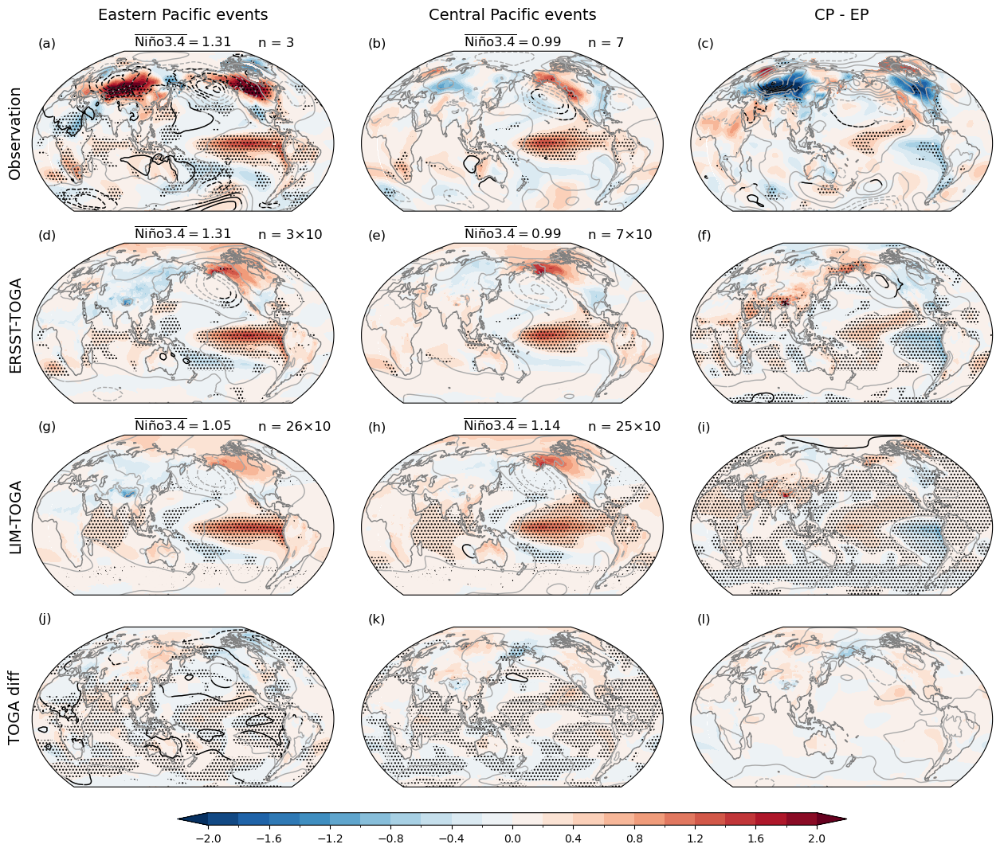

In [112]:
# 9 panels TS & PSL

# ---------------------------Universal----------------------------
levels = np.linspace(-2,2,21)
sublabel = ['(a)','(b)','(c)','(d)','(e)','(f)','(g)','(h)','(i)','(j)','(k)','(l)','(m)','(n)','(o)','(p)','(q)','(r)','(s)','(t)','(u)','(v)','(w)','(x)','(y)','(z)']

# ---------------------------Observation----------------------------

TS_composites_djf = TS_berk_djf_composites_2removed
PSL_composites_djf = PSL_era5_djf_composites_2removed
ENSO_year = TS_ersst_EPCP_2removed
TS_diff_ttest = TS_berk_djf_CPEP_diff_ttest_nino34_2removed
PSL_diff_ttest = PSL_era5_djf_CPEP_diff_ttest_nino34_2removed
nino34 = SST_ersst_nino34_djf_2removed
TS_mask = TS_berk_djf_composites_mask_2removed
PSL_mask = PSL_era5_djf_composites_mask_2removed
SST_composites_djf = SST_ersst_djf_composites_2removed
SST_mask = SST_ersst_djf_composites_mask_2removed
SST_diff_ttest = SST_ersst_djf_CPEP_diff_ttest_nino34_2removed

# Calculate composite differences
SST_composites_CPEP_diff = SST_composites_djf[1]/nino34[1] - SST_composites_djf[0]/nino34[0]
TS_composites_CPEP_diff = TS_composites_djf[1]/nino34[1] - TS_composites_djf[0]/nino34[0]
PSL_composites_CPEP_diff = PSL_composites_djf[1]/nino34[1] - PSL_composites_djf[0]/nino34[0]

# Plotting
fig, axes = plt.subplots(4,3, figsize=(16,12),subplot_kw=dict(projection=WinkelTripel(central_longitude = -200)))
for i in range(2):
    ax = axes[0, i]
    SST = (SST_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    ax.contourf(SST_mask[i].lon, SST_mask[i].lat, SST_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    SST_diff = SST_composites_CPEP_diff.plot.contourf(ax=axes[0, 2],levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    axes[0,2].contourf(SST_diff_ttest.lon, SST_diff_ttest.lat, SST_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
    TS = (TS_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    PSL = (PSL_composites_djf[i]/nino34[i]).plot.contour(ax=ax,colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    PSL = (PSL_composites_djf[i]/nino34[i]).where(PSL_mask[i]).plot.contour(ax=ax,colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    ax.annotate(rf'$\overline{{\mathrm{{Niño3.4}}}} = {np.round(nino34[i], 2)}$', xy=(0.5, 1.03), xycoords='axes fraction', fontsize=12, horizontalalignment='center')
    ax.annotate('n = {}'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
    ax.contourf(TS_mask[i].lon, TS_mask[i].lat, TS_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
TS_diff = TS_composites_CPEP_diff.plot.contourf(ax=axes[0,2],levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[0,2].contourf(TS_diff_ttest.lon, TS_diff_ttest.lat, TS_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.plot.contour(ax=axes[0,2],colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.where(PSL_diff_ttest<0.1).plot.contour(ax=axes[0,2],colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())

# ----------------------------ERSST-TOGA--------------------------------------

TS_composites_djf = TS_ersst_djf_composites_2removed
PSL_composites_djf = PSL_ersst_djf_composites_2removed
ENSO_year = TS_ersst_EPCP_2removed
TS_diff_ttest = TS_ersst_djf_CPEP_diff_ttest_nino34_2removed
PSL_diff_ttest = PSL_ersst_djf_CPEP_diff_ttest_nino34_2removed
nino34 = TS_ersst_nino34_djf_2removed
TS_mask = TS_ersst_djf_composites_mask_2removed
PSL_mask = PSL_ersst_djf_composites_mask_2removed

# Calculate composite differences
TS_composites_CPEP_diff = TS_composites_djf[1]/nino34[1] - TS_composites_djf[0]/nino34[0]
PSL_composites_CPEP_diff = PSL_composites_djf[1]/nino34[1] - PSL_composites_djf[0]/nino34[0]

for i in range(2):
    ax = axes[1, i]
    TS = (TS_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    PSL = (PSL_composites_djf[i]/nino34[i]).plot.contour(ax=ax,colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    PSL = (PSL_composites_djf[i]/nino34[i]).where(PSL_mask[i]).plot.contour(ax=ax,colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    ax.annotate(rf'$\overline{{\mathrm{{Niño3.4}}}} = {np.round(nino34[i], 2)}$', xy=(0.5, 1.03), xycoords='axes fraction', fontsize=12, horizontalalignment='center')
    ax.annotate('n = {}×10'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
    ax.contourf(TS_mask[i].lon, TS_mask[i].lat, TS_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
TS_diff = TS_composites_CPEP_diff.plot.contourf(ax=axes[1,2],levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[1,2].contourf(TS_diff_ttest.lon, TS_diff_ttest.lat, TS_diff_ttest, levels = [0.0,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.plot.contour(ax=axes[1,2],colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.where(PSL_diff_ttest<0.1).plot.contour(ax=axes[1,2],colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())

# ----------------------------LIM-TOGA--------------------------------------

TS_composites_djf = TS_LIM_djf_composites
PSL_composites_djf = PSL_LIM_djf_composites
ENSO_year = TS_LIM_EPCP
TS_diff_ttest = TS_LIM_djf_CPEP_diff_ttest_nino34
PSL_diff_ttest = PSL_LIM_djf_CPEP_diff_ttest_nino34
nino34 = TS_LIM_nino34_djf
TS_mask = TS_LIM_djf_composites_mask
PSL_mask = PSL_LIM_djf_composites_mask

# Calculate composite differences
TS_composites_CPEP_diff = TS_composites_djf[1]/nino34[1] - TS_composites_djf[0]/nino34[0]
PSL_composites_CPEP_diff = PSL_composites_djf[1]/nino34[1] - PSL_composites_djf[0]/nino34[0]

for i in range(2):
    ax = axes[2, i]
    TS = (TS_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    PSL = (PSL_composites_djf[i]/nino34[i]).plot.contour(ax=ax,colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    PSL = (PSL_composites_djf[i]/nino34[i]).where(PSL_mask[i]).plot.contour(ax=ax,colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    ax.annotate(rf'$\overline{{\mathrm{{Niño3.4}}}} = {np.round(nino34[i], 2)}$', xy=(0.5, 1.03), xycoords='axes fraction', fontsize=12, horizontalalignment='center')
    ax.annotate('n = {}×10'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
    ax.contourf(TS_mask[i].lon, TS_mask[i].lat, TS_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
TS_diff = TS_composites_CPEP_diff.plot.contourf(ax=axes[2,2],levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[2,2].contourf(TS_diff_ttest.lon, TS_diff_ttest.lat, TS_diff_ttest, levels = [0.0,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.plot.contour(ax=axes[2,2],colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.where(PSL_diff_ttest<0.1).plot.contour(ax=axes[2,2],colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())

# ----------------------LIM-TOGA - ERSST-TOGA--------------------------------------

TS_E_composites_djf = TS_ersst_djf_composites_2removed
PSL_E_composites_djf = PSL_ersst_djf_composites_2removed
nino34_E = TS_ersst_nino34_djf_2removed

TS_L_composites_djf = TS_LIM_djf_composites
PSL_L_composites_djf = PSL_LIM_djf_composites
nino34_L = TS_LIM_nino34_djf

TS_diff_ttest = TS_LminusE_djf_CPEP_diff_ttest_nino34_2removed
PSL_diff_ttest = PSL_LminusE_djf_CPEP_diff_ttest_nino34_2removed
TS_mask = TS_LminusE_djf_composites_mask_2removed
PSL_mask = PSL_LminusE_djf_composites_mask_2removed

# Calculate composite differences
TS_composites_CPEP_diff = (TS_L_composites_djf[1]/nino34_L[1] - TS_L_composites_djf[0]/nino34_L[0]) - (TS_E_composites_djf[1]/nino34_E[1] - TS_L_composites_djf[0]/nino34_L[0])
PSL_composites_CPEP_diff = (PSL_L_composites_djf[1]/nino34_L[1] - PSL_L_composites_djf[0]/nino34_L[0]) - (PSL_E_composites_djf[1]/nino34_E[1] - PSL_E_composites_djf[0]/nino34_E[0])

for i in range(2):
    ax = axes[3, i]
    TS = (TS_L_composites_djf[i]/nino34_L[i] - TS_E_composites_djf[i]/nino34_E[i]).plot.contourf(ax=ax,levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    PSL = (PSL_L_composites_djf[i]/nino34_L[i] - PSL_E_composites_djf[i]/nino34_E[i]).plot.contour(ax=ax,colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    PSL = (PSL_L_composites_djf[i]/nino34_L[i] - PSL_E_composites_djf[i]/nino34_E[i]).where(PSL_mask[i]).plot.contour(ax=ax,colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    ax.contourf(TS_mask[i].lon, TS_mask[i].lat, TS_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
TS_diff = TS_composites_CPEP_diff.plot.contourf(ax=axes[3,2],levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[3,2].contourf(TS_diff_ttest.lon, TS_diff_ttest.lat, TS_diff_ttest, levels = [0.0,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.plot.contour(ax=axes[3,2],colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.where(PSL_diff_ttest<0.1).plot.contour(ax=axes[3,2],colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())

# ----------------------------Universal--------------------------------------
for i in range(4):
    for j in range(3):
        axes[i,j].coastlines(color='grey')
        axes[i,j].annotate(sublabel[3*i+j], xy=(0.02, 1.03), xycoords='axes fraction', fontsize=12)
        axes[i,j].set_extent([-19.99, 339.99, -57, 90], crs=ccrs.PlateCarree())
    

# colorbar
cax = plt.axes([0.25, 0.07, 0.525, 0.013]) #[left, bottom, width, height]
plt.colorbar(TS,cax=cax,orientation='horizontal')
cax.set_xticks(np.linspace(-2,2,21)[::2])

# subtitles
axes[0, 0].annotate('Eastern Pacific events', xy=(0.5, 1.2), xycoords='axes fraction', fontsize=14, rotation = 'horizontal', horizontalalignment='center')
axes[0, 1].annotate('Central Pacific events', xy=(0.5, 1.2), xycoords='axes fraction', fontsize=14, rotation = 'horizontal', horizontalalignment='center')
axes[0, 2].annotate('CP - EP', xy=(0.5, 1.2), xycoords='axes fraction', fontsize=14, rotation = 'horizontal', horizontalalignment='center')
axes[0, 0].annotate('Observation', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')
axes[1, 0].annotate('ERSST-TOGA', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')
axes[2, 0].annotate('LIM-TOGA', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')
axes[3, 0].annotate('TOGA diff', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')

# # latitude-longitude label
# for i in range(3):
#     axes[2,i].set_xticks([0, 60, 120, 180, 240, 300, 360], crs=ccrs.PlateCarree())
#     axes[2,i].set_xticklabels(['0°E','60°E','120°E','180°E','120°W','60°W','0°W'])
#     axes[2,i].set_xlabel('')  
#     axes[i,0].set_yticks([-60,-30,-0,30,60, 90], crs=ccrs.PlateCarree())
#     axes[i,0].set_yticklabels(['60°S','30°S','0°N','30°N','60°N','90°N'])
#     axes[i,0].set_ylabel('')

# plt.suptitle('1980-2016 ENSO events DJF composites - Temperature and Pressure', fontsize = 14)
plt.subplots_adjust(wspace=0.0, hspace=0.2)
plt.show()

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/matplotlib/contour.py:1454: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/matplotlib/contour.py:1455: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())


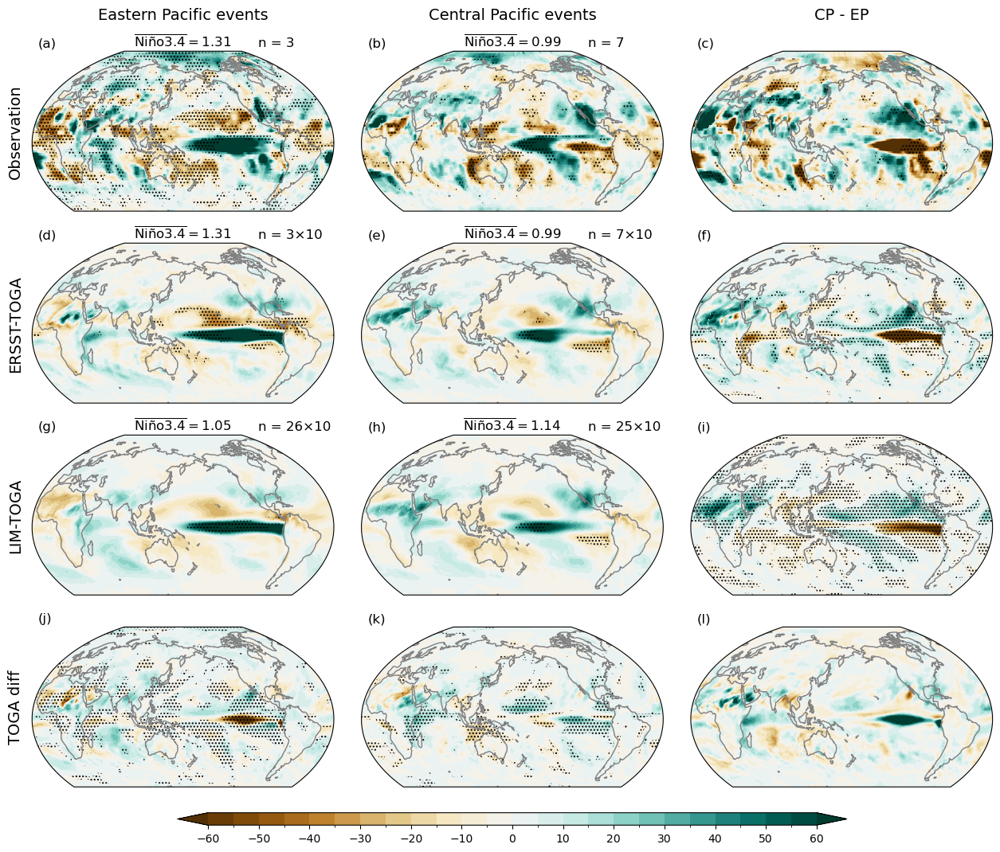

In [113]:
# 9 panels PRECIP

# ---------------------------Universal----------------------------
levels = np.linspace(-60,60,25)

# ---------------------------Observation----------------------------

PRECIP_composites_djf = PRECIP_gpcp_djf_composites_2removed
ENSO_year = TS_ersst_EPCP_2removed
PRECIP_diff_ttest = PRECIP_gpcp_djf_CPEP_diff_ttest_nino34_2removed
nino34 = SST_ersst_nino34_djf_2removed
PRECIP_mask = PRECIP_gpcp_djf_composites_mask_2removed

# Calculate composite differences
PRECIP_composites_CPEP_diff = PRECIP_composites_djf[1]/nino34[1] - PRECIP_composites_djf[0]/nino34[0]

# Plotting
fig, axes = plt.subplots(4,3, figsize=(16,12),subplot_kw=dict(projection=WinkelTripel(central_longitude = -200)))
for i in range(2):
    ax = axes[0, i]
    PRECIP = (PRECIP_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    ax.annotate(rf'$\overline{{\mathrm{{Niño3.4}}}} = {np.round(nino34[i], 2)}$', xy=(0.5, 1.03), xycoords='axes fraction', fontsize=12, horizontalalignment='center')
    ax.annotate('n = {}'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
    ax.contourf(PRECIP_mask[i].lon, PRECIP_mask[i].lat, PRECIP_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
PRECIP_diff = PRECIP_composites_CPEP_diff.plot.contourf(ax=axes[0,2],levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[0,2].contourf(PRECIP_diff_ttest.lon, PRECIP_diff_ttest.lat, PRECIP_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())

# ----------------------------ERSST-TOGA--------------------------------------

PRECIP_composites_djf = PRECIP_ersst_djf_composites_2removed
ENSO_year = TS_ersst_EPCP_2removed
PRECIP_diff_ttest = PRECIP_ersst_djf_CPEP_diff_ttest_nino34_2removed
nino34 = TS_ersst_nino34_djf_2removed
PRECIP_mask = PRECIP_ersst_djf_composites_mask_2removed

# Calculate composite differences
PRECIP_composites_CPEP_diff = PRECIP_composites_djf[1]/nino34[1] - PRECIP_composites_djf[0]/nino34[0]

# Plotting
for i in range(2):
    ax = axes[1, i]
    PRECIP = (PRECIP_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    ax.annotate(rf'$\overline{{\mathrm{{Niño3.4}}}} = {np.round(nino34[i], 2)}$', xy=(0.5, 1.03), xycoords='axes fraction', fontsize=12, horizontalalignment='center')
    ax.annotate('n = {}×10'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
    ax.contourf(PRECIP_mask[i].lon, PRECIP_mask[i].lat, PRECIP_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
PRECIP_diff = PRECIP_composites_CPEP_diff.plot.contourf(ax=axes[1,2],levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[1,2].contourf(PRECIP_diff_ttest.lon, PRECIP_diff_ttest.lat, PRECIP_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())


# ----------------------------LIM-TOGA--------------------------------------

PRECIP_composites_djf = PRECIP_LIM_djf_composites
ENSO_year = TS_LIM_EPCP
PRECIP_diff_ttest = PRECIP_LIM_djf_CPEP_diff_ttest_nino34
nino34 = TS_LIM_nino34_djf
PRECIP_mask = PRECIP_LIM_djf_composites_mask

# Calculate composite differences
PRECIP_composites_CPEP_diff = PRECIP_composites_djf[1]/nino34[1] - PRECIP_composites_djf[0]/nino34[0]

# Plotting
for i in range(2):
    ax = axes[2, i]
    PRECIP = (PRECIP_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    ax.annotate(rf'$\overline{{\mathrm{{Niño3.4}}}} = {np.round(nino34[i], 2)}$', xy=(0.5, 1.03), xycoords='axes fraction', fontsize=12, horizontalalignment='center')
    ax.annotate('n = {}×10'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
    ax.contourf(PRECIP_mask[i].lon, PRECIP_mask[i].lat, PRECIP_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
PRECIP_diff = PRECIP_composites_CPEP_diff.plot.contourf(ax=axes[2,2],levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[2,2].contourf(PRECIP_diff_ttest.lon, PRECIP_diff_ttest.lat, PRECIP_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())

# ----------------------LIM-TOGA - ERSST-TOGA--------------------------------------
PRECIP_E_composites_djf = PRECIP_ersst_djf_composites_2removed
nino34_E = TS_ersst_nino34_djf_2removed

PRECIP_L_composites_djf = PRECIP_LIM_djf_composites
nino34_L = TS_LIM_nino34_djf

PRECIP_diff_ttest = PRECIP_LminusE_djf_CPEP_diff_ttest_nino34_2removed
PRECIP_mask = PRECIP_LminusE_djf_composites_mask_2removed

# Calculate composite differences
PRECIP_composites_CPEP_diff = (PRECIP_L_composites_djf[1]/nino34_L[1] - PRECIP_L_composites_djf[0]/nino34_L[0]) - (PRECIP_E_composites_djf[1]/nino34_E[1] - PRECIP_E_composites_djf[0]/nino34_E[0])

# Plotting
for i in range(2):
    ax = axes[3, i]
    PRECIP = (PRECIP_L_composites_djf[i]/nino34_L[i] - PRECIP_E_composites_djf[i]/nino34_E[i]).plot.contourf(ax=ax,levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    ax.contourf(PRECIP_mask[i].lon, PRECIP_mask[i].lat, PRECIP_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
PRECIP_diff = PRECIP_composites_CPEP_diff.plot.contourf(ax=axes[3,2],levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[3,2].contourf(PRECIP_diff_ttest.lon, PRECIP_diff_ttest.lat, PRECIP_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())

# ----------------------------Universal--------------------------------------
for i in range(4):
    for j in range(3):
        axes[i,j].coastlines(color='grey')
        axes[i,j].annotate(sublabel[3*i+j], xy=(0.02, 1.03), xycoords='axes fraction', fontsize=12)
        axes[i,j].set_extent([-19.99, 339.99, -57, 90], crs=ccrs.PlateCarree())
    

# colorbar
cax = plt.axes([0.25, 0.07, 0.525, 0.013]) #[left, bottom, width, height]
plt.colorbar(PRECIP,cax=cax,orientation='horizontal')
cax.set_xticks(levels[::2])

# subtitles
axes[0, 0].annotate('Eastern Pacific events', xy=(0.5, 1.2), xycoords='axes fraction', fontsize=14, rotation = 'horizontal', horizontalalignment='center')
axes[0, 1].annotate('Central Pacific events', xy=(0.5, 1.2), xycoords='axes fraction', fontsize=14, rotation = 'horizontal', horizontalalignment='center')
axes[0, 2].annotate('CP - EP', xy=(0.5, 1.2), xycoords='axes fraction', fontsize=14, rotation = 'horizontal', horizontalalignment='center')
axes[0, 0].annotate('Observation', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')
axes[1, 0].annotate('ERSST-TOGA', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')
axes[2, 0].annotate('LIM-TOGA', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')
axes[3, 0].annotate('TOGA diff', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')

plt.subplots_adjust(wspace=0.00, hspace=0.2)
plt.show()

#### LIM - only consider 4 events with nino3.4 ~ 1.75

In [114]:
# LIM - only consider 4 events with nino3.4 ~ 1.75; the years are: 1112, 1099, 1024, 1082

# EP CP list
TS_LIM_EPCP_4strong = [[1112, 1099, 1024, 1082]+TS_LIM_EPCP[2], [1112, 1099, 1024, 1082], TS_LIM_EPCP[2]]

# All ndj composites for 4 strongest EP
TS_LIM_djf_4strong = TS_LIM_djf.copy()
TS_LIM_djf_4strong[0] = TS_LIM_djf[0].sel(time = TS_LIM_djf[0].time.dt.year.isin([1112, 1099, 1024, 1082]))
PSL_LIM_djf_4strong = PSL_LIM_djf.copy()
PSL_LIM_djf_4strong[0] = PSL_LIM_djf[0].sel(time = PSL_LIM_djf[0].time.dt.year.isin([1112, 1099, 1024, 1082]))
PRECIP_LIM_djf_4strong = PRECIP_LIM_djf.copy()
PRECIP_LIM_djf_4strong[0] = PRECIP_LIM_djf[0].sel(time = PRECIP_LIM_djf[0].time.dt.year.isin([1112, 1099, 1024, 1082]))

# ndj nino34 mean for scaling
TS_LIM_nino34_djf_4strong = TS_LIM_nino34_djf.copy()
TS_LIM_nino34_djf_4strong[0] = select_enso_djf(TS_LIM_nino34, [1112, 1099, 1024, 1082]).mean(dim='time').values

# CPEP diff t-test
TS_LIM_djf_CPEP_diff_ttest_nino34_4strong = two_sample_diff_ttest(TS_LIM_djf_4strong[1]/TS_LIM_nino34_djf_4strong[1], TS_LIM_djf_4strong[0]/TS_LIM_nino34_djf_4strong[0], axis = [0,3])
TS_LminusE_djf_CPEP_diff_ttest_nino34_4strong = two_sample_diff_ttest(TS_LIM_djf_4strong[1]/TS_LIM_nino34_djf_4strong[1] - TS_LIM_djf_4strong[0]/TS_LIM_nino34_djf_4strong[0], TS_ersst_djf[1]/TS_ersst_nino34_djf[1] - TS_ersst_djf[0]/TS_ersst_nino34_djf[0], axis = [0,3])

PSL_LIM_djf_CPEP_diff_ttest_nino34_4strong = two_sample_diff_ttest(PSL_LIM_djf_4strong[1]/TS_LIM_nino34_djf_4strong[1], PSL_LIM_djf_4strong[0]/TS_LIM_nino34_djf_4strong[0], axis = [0,3])
PSL_LminusE_djf_CPEP_diff_ttest_nino34_4strong = two_sample_diff_ttest(PSL_LIM_djf_4strong[1]/TS_LIM_nino34_djf_4strong[1] - PSL_LIM_djf_4strong[0]/TS_LIM_nino34_djf_4strong[0], PSL_ersst_djf[1]/TS_ersst_nino34_djf[1] - PSL_ersst_djf[0]/TS_ersst_nino34_djf[0], axis = [0,3])

PRECIP_LIM_djf_CPEP_diff_ttest_nino34_4strong = two_sample_diff_ttest(PRECIP_LIM_djf_4strong[1]/TS_LIM_nino34_djf_4strong[1], PRECIP_LIM_djf_4strong[0]/TS_LIM_nino34_djf_4strong[0], axis = [0,3])
PRECIP_LminusE_djf_CPEP_diff_ttest_nino34_4strong = two_sample_diff_ttest(PRECIP_LIM_djf_4strong[1]/TS_LIM_nino34_djf_4strong[1] - PRECIP_LIM_djf_4strong[0]/TS_LIM_nino34_djf_4strong[0], PRECIP_ersst_djf[1]/TS_ersst_nino34_djf[1] - PRECIP_ersst_djf[0]/TS_ersst_nino34_djf[0], axis = [0,3])

# composites
TS_LIM_djf_composites_4strong = [TS_LIM_djf_4strong[i].mean(dim = ['time', 'ens_number']) for i in range(2)]

PSL_LIM_djf_composites_4strong = [PSL_LIM_djf_4strong[i].mean(dim = ['time', 'ens_number']) for i in range(2)]

PRECIP_LIM_djf_composites_4strong = [PRECIP_LIM_djf_4strong[i].mean(dim = ['time', 'ens_number']) for i in range(2)]

# variance over both time and ensemble members
TS_LIM_djf_var_event_and_ens_4strong = [TS_LIM_djf_4strong[i].var(dim = ['time', 'ens_number']) for i in range(2)]
TS_LminusE_djf_var_event_and_ens_4strong = [(TS_LIM_djf_4strong[i] - TS_ersst_djf[i]).var(dim = ['time', 'ens_number']) for i in range(2)]

PSL_LIM_djf_var_event_and_ens_4strong = [PSL_LIM_djf_4strong[i].var(dim = ['time', 'ens_number']) for i in range(2)]
PSL_LminusE_djf_var_event_and_ens_4strong = [(PSL_LIM_djf_4strong[i] - PSL_ersst_djf[i]).var(dim = ['time', 'ens_number']) for i in range(2)]

PRECIP_LIM_djf_var_event_and_ens_4strong = [PRECIP_LIM_djf_4strong[i].var(dim = ['time', 'ens_number']) for i in range(2)]
PRECIP_LminusE_djf_var_event_and_ens_4strong = [(PRECIP_LIM_djf_4strong[i] - PRECIP_ersst_djf[i]).var(dim = ['time', 'ens_number']) for i in range(2)]

# mask out area where signal-to-noise ratio > 1
TS_LIM_djf_composites_mask_4strong = [abs(TS_LIM_djf_composites_4strong[i] / np.sqrt(TS_LIM_djf_var_event_and_ens_4strong[i])) > 1 for i in [0,1]]
TS_LminusE_djf_composites_mask_4strong = [two_sample_diff_ttest(TS_LIM_djf_4strong[i]/TS_LIM_nino34_djf_4strong[i], TS_ersst_djf[1]/TS_ersst_nino34_djf[1], axis = [0,3]) < 0.1 for i in [0,1]]

PSL_LIM_djf_composites_mask_4strong = [abs(PSL_LIM_djf_composites_4strong[i] / np.sqrt(PSL_LIM_djf_var_event_and_ens_4strong[i])) > 1 for i in [0,1]]
PSL_LminusE_djf_composites_mask_4strong = [two_sample_diff_ttest(PSL_LIM_djf_4strong[i]/TS_LIM_nino34_djf_4strong[i], PSL_ersst_djf[1]/TS_ersst_nino34_djf[1], axis = [0,3]) < 0.1 for i in [0,1]]

PRECIP_LIM_djf_composites_mask_4strong = [abs(PRECIP_LIM_djf_composites_4strong[i] / np.sqrt(PRECIP_LIM_djf_var_event_and_ens_4strong[i])) > 1 for i in [0,1]]
PRECIP_LminusE_djf_composites_mask_4strong = [two_sample_diff_ttest(PRECIP_LIM_djf_4strong[i]/TS_LIM_nino34_djf_4strong[i], PRECIP_ersst_djf[1]/TS_ersst_nino34_djf[1], axis = [0,3]) < 0.1 for i in [0,1]]

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/nputils.py:208: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/nputils.py:208: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/nputils.py:208: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xarray/core/nputils.py:208: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = getattr(npmodule, name)(values, axis=axis, **kwargs)
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/xar

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/matplotlib/contour.py:1454: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/matplotlib/contour.py:1455: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/matplotlib/contour.py:1454: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/matplotlib/contour.py:1455: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())


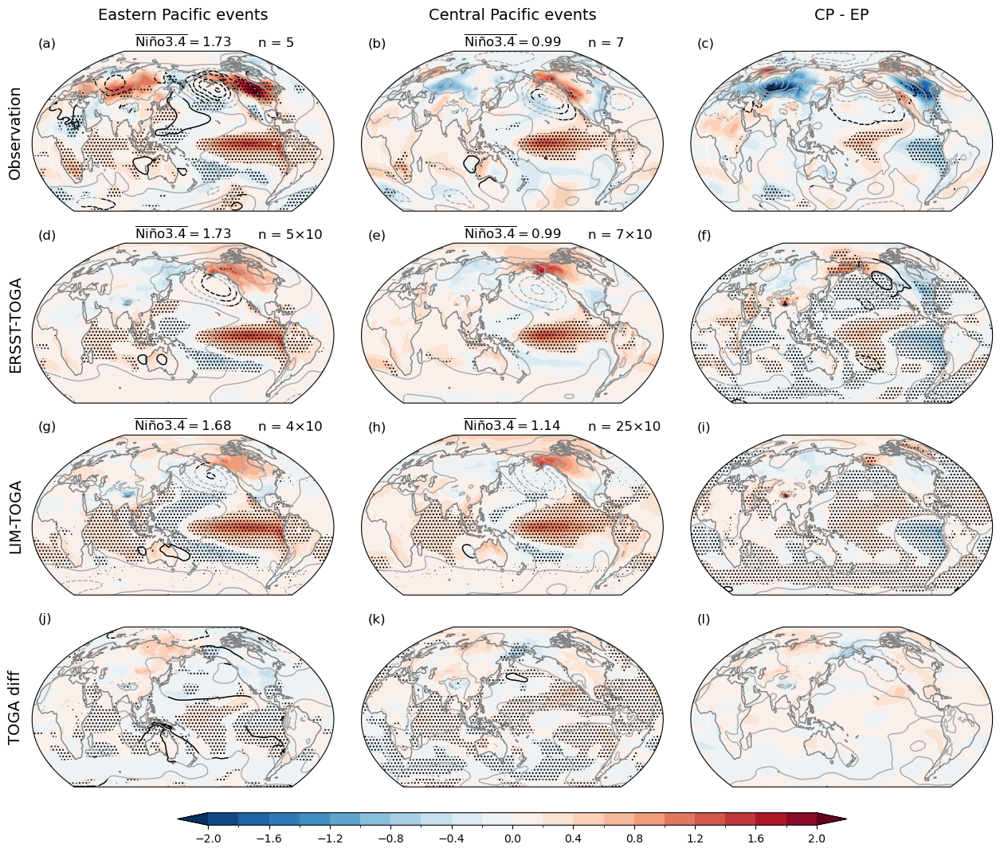

In [115]:
# 9 panels TS & PSL

# ---------------------------Universal----------------------------
levels = np.linspace(-2,2,21)
sublabel = ['(a)','(b)','(c)','(d)','(e)','(f)','(g)','(h)','(i)','(j)','(k)','(l)','(m)','(n)','(o)','(p)','(q)','(r)','(s)','(t)','(u)','(v)','(w)','(x)','(y)','(z)']

# ---------------------------Observation----------------------------

TS_composites_djf = TS_berk_djf_composites
PSL_composites_djf = PSL_era5_djf_composites
ENSO_year = TS_ersst_EPCP
TS_diff_ttest = TS_berk_djf_CPEP_diff_ttest_nino34
PSL_diff_ttest = PSL_era5_djf_CPEP_diff_ttest_nino34
nino34 = SST_ersst_nino34_djf
TS_mask = TS_berk_djf_composites_mask
PSL_mask = PSL_era5_djf_composites_mask
SST_composites_djf = SST_ersst_djf_composites
SST_mask = SST_ersst_djf_composites_mask
SST_diff_ttest = SST_ersst_djf_CPEP_diff_ttest_nino34

# Calculate composite differences
SST_composites_CPEP_diff = SST_composites_djf[1]/nino34[1] - SST_composites_djf[0]/nino34[0]
TS_composites_CPEP_diff = TS_composites_djf[1]/nino34[1] - TS_composites_djf[0]/nino34[0]
PSL_composites_CPEP_diff = PSL_composites_djf[1]/nino34[1] - PSL_composites_djf[0]/nino34[0]

# Plotting
fig, axes = plt.subplots(4,3, figsize=(16,12),subplot_kw=dict(projection=WinkelTripel(central_longitude = -200)))
for i in range(2):
    ax = axes[0, i]
    SST = (SST_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    ax.contourf(SST_mask[i].lon, SST_mask[i].lat, SST_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    SST_diff = SST_composites_CPEP_diff.plot.contourf(ax=axes[0, 2],levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    axes[0,2].contourf(SST_diff_ttest.lon, SST_diff_ttest.lat, SST_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
    TS = (TS_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    PSL = (PSL_composites_djf[i]/nino34[i]).plot.contour(ax=ax,colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    PSL = (PSL_composites_djf[i]/nino34[i]).where(PSL_mask[i]).plot.contour(ax=ax,colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    ax.annotate(rf'$\overline{{\mathrm{{Niño3.4}}}} = {np.round(nino34[i], 2)}$', xy=(0.5, 1.03), xycoords='axes fraction', fontsize=12, horizontalalignment='center')
    ax.annotate('n = {}'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
    ax.contourf(TS_mask[i].lon, TS_mask[i].lat, TS_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
TS_diff = TS_composites_CPEP_diff.plot.contourf(ax=axes[0,2],levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[0,2].contourf(TS_diff_ttest.lon, TS_diff_ttest.lat, TS_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.plot.contour(ax=axes[0,2],colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.where(PSL_diff_ttest<0.1).plot.contour(ax=axes[0,2],colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())

# ----------------------------ERSST-TOGA--------------------------------------

TS_composites_djf = TS_ersst_djf_composites
PSL_composites_djf = PSL_ersst_djf_composites
ENSO_year = TS_ersst_EPCP
TS_diff_ttest = TS_ersst_djf_CPEP_diff_ttest_nino34
PSL_diff_ttest = PSL_ersst_djf_CPEP_diff_ttest_nino34
nino34 = TS_ersst_nino34_djf
TS_mask = TS_ersst_djf_composites_mask
PSL_mask = PSL_ersst_djf_composites_mask

# Calculate composite differences
TS_composites_CPEP_diff = TS_composites_djf[1]/nino34[1] - TS_composites_djf[0]/nino34[0]
PSL_composites_CPEP_diff = PSL_composites_djf[1]/nino34[1] - PSL_composites_djf[0]/nino34[0]

for i in range(2):
    ax = axes[1, i]
    TS = (TS_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    PSL = (PSL_composites_djf[i]/nino34[i]).plot.contour(ax=ax,colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    PSL = (PSL_composites_djf[i]/nino34[i]).where(PSL_mask[i]).plot.contour(ax=ax,colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    ax.annotate(rf'$\overline{{\mathrm{{Niño3.4}}}} = {np.round(nino34[i], 2)}$', xy=(0.5, 1.03), xycoords='axes fraction', fontsize=12, horizontalalignment='center')
    ax.annotate('n = {}×10'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
    ax.contourf(TS_mask[i].lon, TS_mask[i].lat, TS_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
TS_diff = TS_composites_CPEP_diff.plot.contourf(ax=axes[1,2],levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[1,2].contourf(TS_diff_ttest.lon, TS_diff_ttest.lat, TS_diff_ttest, levels = [0.0,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.plot.contour(ax=axes[1,2],colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.where(PSL_diff_ttest<0.1).plot.contour(ax=axes[1,2],colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())

# ----------------------------LIM-TOGA--------------------------------------

TS_composites_djf = TS_LIM_djf_composites_4strong
PSL_composites_djf = PSL_LIM_djf_composites_4strong
ENSO_year = TS_LIM_EPCP_4strong
TS_diff_ttest = TS_LIM_djf_CPEP_diff_ttest_nino34_4strong
PSL_diff_ttest = PSL_LIM_djf_CPEP_diff_ttest_nino34_4strong
nino34 = TS_LIM_nino34_djf_4strong
TS_mask = TS_LIM_djf_composites_mask_4strong
PSL_mask = PSL_LIM_djf_composites_mask_4strong

# Calculate composite differences
TS_composites_CPEP_diff = TS_composites_djf[1]/nino34[1] - TS_composites_djf[0]/nino34[0]
PSL_composites_CPEP_diff = PSL_composites_djf[1]/nino34[1] - PSL_composites_djf[0]/nino34[0]

for i in range(2):
    ax = axes[2, i]
    TS = (TS_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    PSL = (PSL_composites_djf[i]/nino34[i]).plot.contour(ax=ax,colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    PSL = (PSL_composites_djf[i]/nino34[i]).where(PSL_mask[i]).plot.contour(ax=ax,colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    ax.annotate(rf'$\overline{{\mathrm{{Niño3.4}}}} = {np.round(nino34[i], 2)}$', xy=(0.5, 1.03), xycoords='axes fraction', fontsize=12, horizontalalignment='center')
    ax.annotate('n = {}×10'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
    ax.contourf(TS_mask[i].lon, TS_mask[i].lat, TS_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
TS_diff = TS_composites_CPEP_diff.plot.contourf(ax=axes[2,2],levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[2,2].contourf(TS_diff_ttest.lon, TS_diff_ttest.lat, TS_diff_ttest, levels = [0.0,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.plot.contour(ax=axes[2,2],colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.where(PSL_diff_ttest<0.1).plot.contour(ax=axes[2,2],colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())

# ----------------------LIM-TOGA - ERSST-TOGA--------------------------------------

TS_E_composites_djf = TS_ersst_djf_composites
PSL_E_composites_djf = PSL_ersst_djf_composites
nino34_E = TS_ersst_nino34_djf

TS_L_composites_djf = TS_LIM_djf_composites_4strong
PSL_L_composites_djf = PSL_LIM_djf_composites_4strong
nino34_L = TS_LIM_nino34_djf_4strong

TS_diff_ttest = TS_LminusE_djf_CPEP_diff_ttest_nino34_4strong
PSL_diff_ttest = PSL_LminusE_djf_CPEP_diff_ttest_nino34_4strong
TS_mask = TS_LminusE_djf_composites_mask_4strong
PSL_mask = PSL_LminusE_djf_composites_mask_4strong

# Calculate composite differences
TS_composites_CPEP_diff = (TS_L_composites_djf[1]/nino34_L[1] - TS_L_composites_djf[0]/nino34_L[0]) - (TS_E_composites_djf[1]/nino34_E[1] - TS_L_composites_djf[0]/nino34_L[0])
PSL_composites_CPEP_diff = (PSL_L_composites_djf[1]/nino34_L[1] - PSL_L_composites_djf[0]/nino34_L[0]) - (PSL_E_composites_djf[1]/nino34_E[1] - PSL_E_composites_djf[0]/nino34_E[0])

for i in range(2):
    ax = axes[3, i]
    TS = (TS_L_composites_djf[i]/nino34_L[i] - TS_E_composites_djf[i]/nino34_E[i]).plot.contourf(ax=ax,levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    PSL = (PSL_L_composites_djf[i]/nino34_L[i] - PSL_E_composites_djf[i]/nino34_E[i]).plot.contour(ax=ax,colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    PSL = (PSL_L_composites_djf[i]/nino34_L[i] - PSL_E_composites_djf[i]/nino34_E[i]).where(PSL_mask[i]).plot.contour(ax=ax,colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree()) 
    ax.contourf(TS_mask[i].lon, TS_mask[i].lat, TS_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
TS_diff = TS_composites_CPEP_diff.plot.contourf(ax=axes[3,2],levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[3,2].contourf(TS_diff_ttest.lon, TS_diff_ttest.lat, TS_diff_ttest, levels = [0.0,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.plot.contour(ax=axes[3,2],colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.where(PSL_diff_ttest<0.1).plot.contour(ax=axes[3,2],colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())

# ----------------------------Universal--------------------------------------
for i in range(4):
    for j in range(3):
        axes[i,j].coastlines(color='grey')
        axes[i,j].annotate(sublabel[3*i+j], xy=(0.02, 1.03), xycoords='axes fraction', fontsize=12)
        axes[i,j].set_extent([-19.99, 339.99, -57, 90], crs=ccrs.PlateCarree())
    

# colorbar
cax = plt.axes([0.25, 0.07, 0.525, 0.013]) #[left, bottom, width, height]
plt.colorbar(TS,cax=cax,orientation='horizontal')
cax.set_xticks(np.linspace(-2,2,21)[::2])

# subtitles
axes[0, 0].annotate('Eastern Pacific events', xy=(0.5, 1.2), xycoords='axes fraction', fontsize=14, rotation = 'horizontal', horizontalalignment='center')
axes[0, 1].annotate('Central Pacific events', xy=(0.5, 1.2), xycoords='axes fraction', fontsize=14, rotation = 'horizontal', horizontalalignment='center')
axes[0, 2].annotate('CP - EP', xy=(0.5, 1.2), xycoords='axes fraction', fontsize=14, rotation = 'horizontal', horizontalalignment='center')
axes[0, 0].annotate('Observation', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')
axes[1, 0].annotate('ERSST-TOGA', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')
axes[2, 0].annotate('LIM-TOGA', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')
axes[3, 0].annotate('TOGA diff', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')

# # latitude-longitude label
# for i in range(3):
#     axes[2,i].set_xticks([0, 60, 120, 180, 240, 300, 360], crs=ccrs.PlateCarree())
#     axes[2,i].set_xticklabels(['0°E','60°E','120°E','180°E','120°W','60°W','0°W'])
#     axes[2,i].set_xlabel('')  
#     axes[i,0].set_yticks([-60,-30,-0,30,60, 90], crs=ccrs.PlateCarree())
#     axes[i,0].set_yticklabels(['60°S','30°S','0°N','30°N','60°N','90°N'])
#     axes[i,0].set_ylabel('')

# plt.suptitle('1980-2016 ENSO events DJF composites - Temperature and Pressure', fontsize = 14)
plt.subplots_adjust(wspace=0.0, hspace=0.2)
plt.show()

/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/matplotlib/contour.py:1454: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/g/data/hh5/public/apps/miniconda3/envs/analysis3-23.10/lib/python3.10/site-packages/matplotlib/contour.py:1455: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())


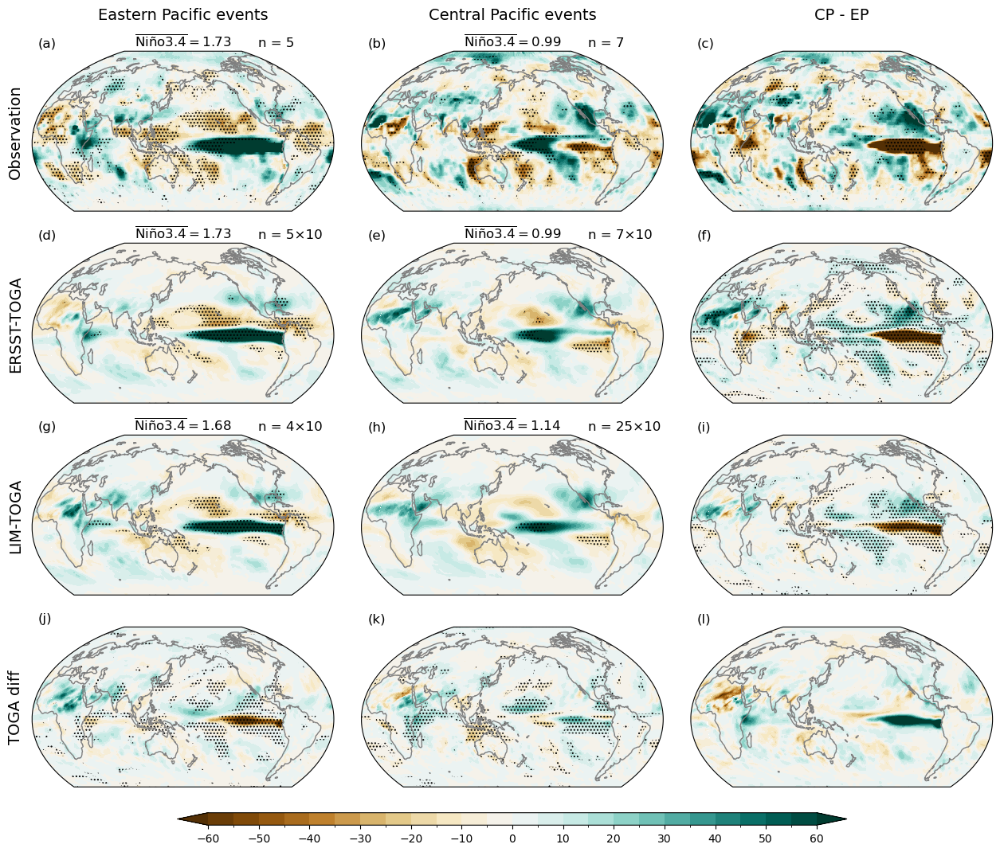

In [116]:
# 9 panels PRECIP

# ---------------------------Universal----------------------------
levels = np.linspace(-60,60,25)

# ---------------------------Observation----------------------------

PRECIP_composites_djf = PRECIP_gpcp_djf_composites
ENSO_year = TS_ersst_EPCP
PRECIP_diff_ttest = PRECIP_gpcp_djf_CPEP_diff_ttest_nino34
nino34 = SST_ersst_nino34_djf
PRECIP_mask = PRECIP_gpcp_djf_composites_mask

# Calculate composite differences
PRECIP_composites_CPEP_diff = PRECIP_composites_djf[1]/nino34[1] - PRECIP_composites_djf[0]/nino34[0]

# Plotting
fig, axes = plt.subplots(4,3, figsize=(16,12),subplot_kw=dict(projection=WinkelTripel(central_longitude = -200)))
for i in range(2):
    ax = axes[0, i]
    PRECIP = (PRECIP_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    ax.annotate(rf'$\overline{{\mathrm{{Niño3.4}}}} = {np.round(nino34[i], 2)}$', xy=(0.5, 1.03), xycoords='axes fraction', fontsize=12, horizontalalignment='center')
    ax.annotate('n = {}'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
    ax.contourf(PRECIP_mask[i].lon, PRECIP_mask[i].lat, PRECIP_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
PRECIP_diff = PRECIP_composites_CPEP_diff.plot.contourf(ax=axes[0,2],levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[0,2].contourf(PRECIP_diff_ttest.lon, PRECIP_diff_ttest.lat, PRECIP_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())

# ----------------------------ERSST-TOGA--------------------------------------

PRECIP_composites_djf = PRECIP_ersst_djf_composites
ENSO_year = TS_ersst_EPCP
PRECIP_diff_ttest = PRECIP_ersst_djf_CPEP_diff_ttest_nino34
nino34 = TS_ersst_nino34_djf
PRECIP_mask = PRECIP_ersst_djf_composites_mask

# Calculate composite differences
PRECIP_composites_CPEP_diff = PRECIP_composites_djf[1]/nino34[1] - PRECIP_composites_djf[0]/nino34[0]

# Plotting
for i in range(2):
    ax = axes[1, i]
    PRECIP = (PRECIP_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    ax.annotate(rf'$\overline{{\mathrm{{Niño3.4}}}} = {np.round(nino34[i], 2)}$', xy=(0.5, 1.03), xycoords='axes fraction', fontsize=12, horizontalalignment='center')
    ax.annotate('n = {}×10'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
    ax.contourf(PRECIP_mask[i].lon, PRECIP_mask[i].lat, PRECIP_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
PRECIP_diff = PRECIP_composites_CPEP_diff.plot.contourf(ax=axes[1,2],levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[1,2].contourf(PRECIP_diff_ttest.lon, PRECIP_diff_ttest.lat, PRECIP_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())


# ----------------------------LIM-TOGA--------------------------------------

PRECIP_composites_djf = PRECIP_LIM_djf_composites_4strong
ENSO_year = TS_LIM_EPCP_4strong
PRECIP_diff_ttest = PRECIP_LIM_djf_CPEP_diff_ttest_nino34_4strong
nino34 = TS_LIM_nino34_djf_4strong
PRECIP_mask = PRECIP_LIM_djf_composites_mask_4strong

# Calculate composite differences
PRECIP_composites_CPEP_diff = PRECIP_composites_djf[1]/nino34[1] - PRECIP_composites_djf[0]/nino34[0]

# Plotting
for i in range(2):
    ax = axes[2, i]
    PRECIP = (PRECIP_composites_djf[i]/nino34[i]).plot.contourf(ax=ax,levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    ax.annotate(rf'$\overline{{\mathrm{{Niño3.4}}}} = {np.round(nino34[i], 2)}$', xy=(0.5, 1.03), xycoords='axes fraction', fontsize=12, horizontalalignment='center')
    ax.annotate('n = {}×10'.format(len(ENSO_year[i+1])), xy=(0.75, 1.03), xycoords='axes fraction', fontsize=12)
    ax.contourf(PRECIP_mask[i].lon, PRECIP_mask[i].lat, PRECIP_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
PRECIP_diff = PRECIP_composites_CPEP_diff.plot.contourf(ax=axes[2,2],levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[2,2].contourf(PRECIP_diff_ttest.lon, PRECIP_diff_ttest.lat, PRECIP_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())

# ----------------------LIM-TOGA - ERSST-TOGA--------------------------------------
PRECIP_E_composites_djf = PRECIP_ersst_djf_composites
nino34_E = TS_ersst_nino34_djf

PRECIP_L_composites_djf = PRECIP_LIM_djf_composites_4strong
nino34_L = TS_LIM_nino34_djf_4strong

PRECIP_diff_ttest = PRECIP_LminusE_djf_CPEP_diff_ttest_nino34_4strong
PRECIP_mask = PRECIP_LminusE_djf_composites_mask_4strong

# Calculate composite differences
PRECIP_composites_CPEP_diff = (PRECIP_L_composites_djf[1]/nino34_L[1] - PRECIP_L_composites_djf[0]/nino34_L[0]) - (PRECIP_E_composites_djf[1]/nino34_E[1] - PRECIP_E_composites_djf[0]/nino34_E[0])
# Plotting
for i in range(2):
    ax = axes[3, i]
    PRECIP = (PRECIP_L_composites_djf[i]/nino34_L[i] - PRECIP_E_composites_djf[i]/nino34_E[i]).plot.contourf(ax=ax,levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False) 
    ax.contourf(PRECIP_mask[i].lon, PRECIP_mask[i].lat, PRECIP_mask[i], levels = [0.99,1.01], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
PRECIP_diff = PRECIP_composites_CPEP_diff.plot.contourf(ax=axes[3,2],levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[3,2].contourf(PRECIP_diff_ttest.lon, PRECIP_diff_ttest.lat, PRECIP_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())

# ----------------------------Universal--------------------------------------
for i in range(4):
    for j in range(3):
        axes[i,j].coastlines(color='grey')
        axes[i,j].annotate(sublabel[3*i+j], xy=(0.02, 1.03), xycoords='axes fraction', fontsize=12)
        axes[i,j].set_extent([-19.99, 339.99, -57, 90], crs=ccrs.PlateCarree())
    

# colorbar
cax = plt.axes([0.25, 0.07, 0.525, 0.013]) #[left, bottom, width, height]
plt.colorbar(PRECIP,cax=cax,orientation='horizontal')
cax.set_xticks(levels[::2])

# subtitles
axes[0, 0].annotate('Eastern Pacific events', xy=(0.5, 1.2), xycoords='axes fraction', fontsize=14, rotation = 'horizontal', horizontalalignment='center')
axes[0, 1].annotate('Central Pacific events', xy=(0.5, 1.2), xycoords='axes fraction', fontsize=14, rotation = 'horizontal', horizontalalignment='center')
axes[0, 2].annotate('CP - EP', xy=(0.5, 1.2), xycoords='axes fraction', fontsize=14, rotation = 'horizontal', horizontalalignment='center')
axes[0, 0].annotate('Observation', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')
axes[1, 0].annotate('ERSST-TOGA', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')
axes[2, 0].annotate('LIM-TOGA', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')
axes[3, 0].annotate('TOGA diff', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')

plt.subplots_adjust(wspace=0.00, hspace=0.2)
plt.show()

### Bootstrapping of different maps

In [129]:
# TS_ersst_djf[0].isel(time = 3, ens_number = 5) has the same file as TS_ersst_djf[0].stack(event=("time", "ens_number")).isel(event = 35)

In [130]:
# Corresponding Nino3.4: SST_ersst_nino34_djf_all and TS_LIM_nino34_djf_all
# Corresponding TS, PSL and PR composites: SST_ersst_djf, TS_berk_djf, TS_ersst_djf, TS_LIM_djf, PSL_era5_djf, PSL_ersst_djf, PSL_LIM_djf, PRECIP_gpcp_djf, PRECIP_ersst_djf, PRECIP_LIM_djf

# TOGA: stack the 'time' and 'ens_number' dimensions as 'event'
# stack order: (time 1, ens 1), (time 1, ens 2), ..., (time 1, ens 10), ... (time 2, ens 1), (time 2, ens 2), ... (time 5, ens 10)
TS_ersst_djf_event = [TS_ersst_djf[i].stack(event=("time", "ens_number")) for i in range(2)]
TS_LIM_djf_event = [TS_LIM_djf[i].stack(event=("time", "ens_number")) for i in range(2)]
PSL_ersst_djf_event = [PSL_ersst_djf[i].stack(event=("time", "ens_number")) for i in range(2)]
PSL_LIM_djf_event = [PSL_LIM_djf[i].stack(event=("time", "ens_number")) for i in range(2)]
PRECIP_ersst_djf_event = [PRECIP_ersst_djf[i].stack(event=("time", "ens_number")) for i in range(2)]
PRECIP_LIM_djf_event = [PRECIP_LIM_djf[i].stack(event=("time", "ens_number")) for i in range(2)]

# Ready for bootstrapping

In [131]:
def bootstrap_CP_EP_diff(ds_event, nino34, seed, bs_size = 100):
    """
    Perform bootstrapping with replacement to generate multiple difference maps.
    
    Parameters:
    ds_event (list of xr.Dataset): TS/PSL/PR djf events, 0 = EP, 1 = CP.
    nino34 (list of np.ndarray): Corresponding nino3.4 values.
    bs_size (int): The number of bootstrap iterations.
    seed (int): Random seed for reproducibility.
    
    Returns:
    xr.DataArray: An xarray DataArray storing 100 different difference maps.
    """
    
    np.random.seed(seed)
    diff_maps = []

    for _ in range(bs_size):
        #------EP---------
        # Get the bootstrapping indices with replacement, n = 50
        indices_EP = np.random.choice(ds_event[0]['event'].size, size=50, replace=True)
        # Find the nino3.4 values for the corresponding 50 selected events
        bs_nino34_EP = nino34[0][indices_EP // 10]
        # Find the TS/PSL/PR of the corresponding 50 selected events
        bs_EP = ds_event[0].isel({'event': indices_EP})
        # Scaled composites of the 50 selected events
        bs_scaled_EP = bs_EP.mean(dim = 'event') / np.mean(bs_nino34_EP)
    
        #------CP---------
        # Get the bootstrapping indices with replacement, n = 50
        indices_CP = np.random.choice(ds_event[1]['event'].size, size=50, replace=True)
        # Find the nino3.4 values for the corresponding 50 selected events
        bs_nino34_CP = nino34[1][indices_CP // 10]
        # Find the TS/PSL/PR of the corresponding 50 selected events
        bs_CP = ds_event[1].isel({'event': indices_CP})
        # Scaled composites of the 50 selected events
        bs_scaled_CP = bs_CP.mean(dim = 'event') / np.mean(bs_nino34_CP)

        # Store the difference map
        diff_maps.append(bs_scaled_CP - bs_scaled_EP)
    
    # Convert list to xarray DataArray
    diff_maps_da = xr.concat(diff_maps, dim='bootstrap')
    diff_maps_da = diff_maps_da.assign_coords(bootstrap=np.arange(bs_size))
    
    return diff_maps_da

In [132]:
# Apply the above function
TS_ersst_djf_CPEP_diff_bootstrap = bootstrap_CP_EP_diff(TS_ersst_djf_event, SST_ersst_nino34_djf_all, 111)
TS_LIM_djf_CPEP_diff_bootstrap = bootstrap_CP_EP_diff(TS_LIM_djf_event, TS_LIM_nino34_djf_all, 112)
PSL_ersst_djf_CPEP_diff_bootstrap = bootstrap_CP_EP_diff(PSL_ersst_djf_event, SST_ersst_nino34_djf_all, 113)
PSL_LIM_djf_CPEP_diff_bootstrap = bootstrap_CP_EP_diff(PSL_LIM_djf_event, TS_LIM_nino34_djf_all, 114)
PRECIP_ersst_djf_CPEP_diff_bootstrap = bootstrap_CP_EP_diff(PRECIP_ersst_djf_event, SST_ersst_nino34_djf_all, 115)
PRECIP_LIM_djf_CPEP_diff_bootstrap = bootstrap_CP_EP_diff(PRECIP_LIM_djf_event, TS_LIM_nino34_djf_all, 116)

In [133]:
# t test of the bootstrapped 
TS_djf_CPEP_diff_LIMersst_diff_ttest = two_sample_diff_ttest(TS_ersst_djf_CPEP_diff_bootstrap, TS_LIM_djf_CPEP_diff_bootstrap, axis=[0])
PSL_djf_CPEP_diff_LIMersst_diff_ttest = two_sample_diff_ttest(PSL_ersst_djf_CPEP_diff_bootstrap, PSL_LIM_djf_CPEP_diff_bootstrap, axis=[0])
PRECIP_djf_CPEP_diff_LIMersst_diff_ttest = two_sample_diff_ttest(PRECIP_ersst_djf_CPEP_diff_bootstrap, PRECIP_LIM_djf_CPEP_diff_bootstrap, axis=[0])

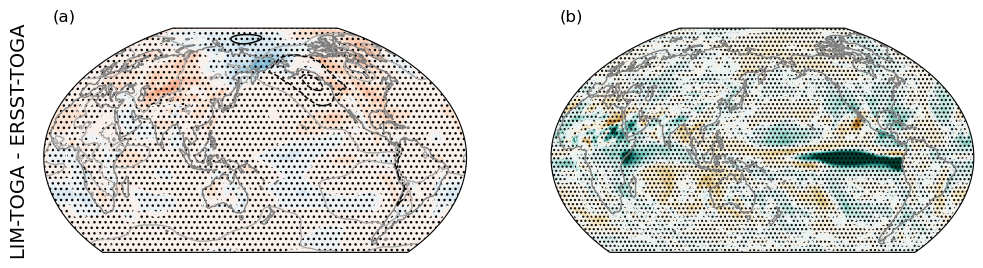

In [134]:
# Plot the difference maps

fig, axes = plt.subplots(1,2, figsize=(12, 4),subplot_kw=dict(projection=WinkelTripel(central_longitude = -200)))

# ------TS and PSL----------------LIM-TOGA - ERSST-TOGA--------------------------------------

TS_E_composites_djf = TS_ersst_djf_CPEP_diff_bootstrap.mean(dim = 'bootstrap')
PSL_E_composites_djf = PSL_ersst_djf_CPEP_diff_bootstrap.mean(dim = 'bootstrap')

TS_L_composites_djf = TS_LIM_djf_CPEP_diff_bootstrap.mean(dim = 'bootstrap')
PSL_L_composites_djf = PSL_LIM_djf_CPEP_diff_bootstrap.mean(dim = 'bootstrap')

TS_diff_ttest = TS_djf_CPEP_diff_LIMersst_diff_ttest
PSL_diff_ttest = PSL_djf_CPEP_diff_LIMersst_diff_ttest

# Calculate composite differences
TS_composites_CPEP_diff = TS_L_composites_djf - TS_E_composites_djf
PSL_composites_CPEP_diff = PSL_L_composites_djf - PSL_E_composites_djf
  
TS_diff = TS_composites_CPEP_diff.plot.contourf(ax=axes[0],levels=np.linspace(-2,2,21),cmap='RdBu_r',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[0].contourf(TS_diff_ttest.lon, TS_diff_ttest.lat, TS_diff_ttest, levels = [0.0,0.10], hatches=['...'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.plot.contour(ax=axes[0],colors='darkgrey',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())
PSL_diff = PSL_composites_CPEP_diff.where(PSL_diff_ttest<0.1).plot.contour(ax=axes[0],colors='black',levels=np.linspace(-10,10,21),extend='both',linewidths=1,transform=ccrs.PlateCarree())

# ------PRECIP----------------LIM-TOGA - ERSST-TOGA--------------------------------------

PRECIP_E_composites_djf = PRECIP_ersst_djf_CPEP_diff_bootstrap.mean(dim = 'bootstrap')

PRECIP_L_composites_djf = PRECIP_LIM_djf_CPEP_diff_bootstrap.mean(dim = 'bootstrap')

PRECIP_diff_ttest = PRECIP_djf_CPEP_diff_LIMersst_diff_ttest

# Calculate composite differences
PRECIP_composites_CPEP_diff = PRECIP_L_composites_djf - PRECIP_E_composites_djf

PRECIP_diff = PRECIP_composites_CPEP_diff.plot.contourf(ax=axes[1],levels=levels,cmap='BrBG',transform=ccrs.PlateCarree(),extend='both',add_colorbar=False)
axes[1].contourf(PRECIP_diff_ttest.lon, PRECIP_diff_ttest.lat, PRECIP_diff_ttest, levels = [0.00,0.10], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())

# ----------------------------Universal--------------------------------------
for i in range(2):
        axes[i].coastlines(color='grey')
        axes[i].annotate(sublabel[i], xy=(0.02, 1.03), xycoords='axes fraction', fontsize=12)
        axes[i].set_extent([-19.99, 339.99, -57, 90], crs=ccrs.PlateCarree())
    
axes[0].annotate('LIM-TOGA - ERSST-TOGA', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=14, rotation = 'vertical', verticalalignment='center')

plt.show()

#### **------------------------GOGA--------------------------------**

In [ ]:
# Shorten data 1980 - 2016
TS_shorten_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/atm/TS/TS_ersstv5_ens*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(1200,1644)).assign_coords(time=time_1980_2016).TS
PSL_shorten_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/atm/PSL/PSL_ersstv5_ens*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(1200,1644)).assign_coords(time=time_1980_2016).PSL / 100
PRECC_shorten_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/atm/PRECC/PRECC_ersstv5_ens*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(1200,1644)).assign_coords(time=time_1980_2016).PRECC 
PRECL_shorten_nomask = xr.open_mfdataset('/g/data/w97/ah3693-2/Summer_intern/atm/PRECL/PRECL_ersstv5_ens*.nc',parallel=True,combine='nested',concat_dim = 'ens_number').isel(time=slice(1200,1644)).assign_coords(time=time_1980_2016).PRECL 
days_in_month = PRECC_shorten_nomask.time.dt.days_in_month
PRECIP_shorten_nomask = (PRECC_shorten_nomask + PRECL_shorten_nomask) * 3600 * 24 * days_in_month * 100

In [ ]:
# Apply Mask
TS_shorten = TS_shorten_nomask.where(mask!=1)

In [ ]:
# Anomaly
TS_shorten_anom = TS_shorten.groupby("time.month") - TS_shorten.groupby("time.month").mean(dim="time")
TS_shorten_nomask_anom = TS_shorten_nomask.groupby("time.month") - TS_shorten_nomask.groupby("time.month").mean(dim="time")
PSL_shorten_nomask_anom = PSL_shorten_nomask.groupby("time.month") - PSL_shorten_nomask.groupby("time.month").mean(dim="time")
PRECIP_shorten_nomask_anom = (PRECIP_shorten_nomask.groupby("time.month") / PRECIP_shorten_nomask.groupby("time.month").mean(dim="time") - 1)*100

In [ ]:
# Detrend
TS_shorten_detrended = detrend(TS_shorten_anom, dim = 'time').transpose("time", "lat", "lon","ens_number")
TS_shorten_nomask_detrended = detrend(TS_shorten_nomask_anom, dim = 'time').transpose("time", "lat", "lon","ens_number")
PSL_shorten_nomask_detrended = detrend(PSL_shorten_nomask_anom, dim = 'time').transpose("time", "lat", "lon","ens_number")
PRECIP_shorten_nomask_detrended = detrend(PRECIP_shorten_nomask_anom, dim = 'time').transpose("time", "lat", "lon","ens_number")

In [ ]:
TS_shorten_EOFs, TS_shorten_PCs = find_PCs(TS_shorten_detrended,2)

In [ ]:
# Change the signs of the EOFs and PCs 
# TS_full_EOFs and TS_full_PCs no change
TS_shorten_EOFs = -TS_shorten_EOFs
TS_shorten_PCs = -TS_shorten_PCs

In [ ]:
# Quadratic fit to PC1 and PC2, fit[ens][a,b,c] for quadratic function
TS_shorten_PCs_fit = np.polyfit(TS_shorten_PCs.sel(mode=0),TS_shorten_PCs.sel(mode=1),2)

In [ ]:
# Calculate the E and C index
TS_shorten_E, TS_shorten_C = E_and_C_index(TS_shorten_PCs)

In [ ]:
# Nino3.4 Index Calculation
TS_shorten_nino34 = nino34index(TS_shorten_detrended)

In [ ]:
# El Nino and La Nina years selections (years having the peaking December is being selected)
TS_shorten_EN, TS_shorten_LN = enso_events(TS_shorten_nino34)

In [ ]:
print(TS_shorten_EN, TS_shorten_LN)

In [ ]:
# Distinguish EP and CP (for both El Nino and La Nina) - EP_El_Nino, CP_El_Nino, EP_La_Nina, CP_La_Nina
TS_shorten_EPCP = CP_EP_ENSO(TS_shorten_E, TS_shorten_C, TS_shorten_EN, TS_shorten_LN)

In [ ]:
print(TS_shorten_EPCP[1:3])

In [ ]:
TS_shorten_nino34_ndj = TS_shorten_nino34.sel(time = TS_shorten_nino34.time.dt.month.isin([11,12,1])).resample(time = 'AS-NOV').mean(dim='time')
# shorten_nino34_for_histogram = [TS_shorten_nino34_ndj.sel(time = TS_shorten_nino34_ndj.time.dt.year.isin([TS_shorten_EPCP[epcp_order]])).isel(ens_number = 0).compute() for epcp_order in range(6)]

In [ ]:
# Find Composites
def seasonal_composites(climate_parameter,ENSO_year):

    seasonal_mean = climate_parameter.resample(time='QS-DEC').mean()
    
    parameter_year1 = seasonal_mean.sel(time=seasonal_mean.time.dt.year.isin([ENSO_year]))

    djf = parameter_year1.sel(time=parameter_year1.time.dt.month.isin([12])).mean(dim='time')
    
    return djf.mean(dim='ens_number')

In [ ]:
# Nino3.4 for scaling
TS_shorten_nino34_djf = [seasonal_composites(TS_shorten_nino34, TS_ersst_EPCP[i]).compute() for i in [1,2]]

In [ ]:
TS_GOGA_djf = [select_enso_djf(TS_shorten_nomask_detrended, TS_shorten_EPCP[i]) for i in [1,2]]
PSL_GOGA_djf = [select_enso_djf(PSL_shorten_nomask_detrended, TS_shorten_EPCP[i]) for i in [1,2]]
PRECIP_GOGA_djf = [select_enso_djf(PRECIP_shorten_nomask_detrended, TS_shorten_EPCP[i]) for i in [1,2]]

In [ ]:
# # Mean of events in each ensemble member - AMIP ERSST
# with scaling TS, all events
TS_GOGA_djf_ens_nino34 = [(TS_GOGA_djf[i]/TS_shorten_nino34_djf[i]).mean(dim = ['time']).compute() for i in range(2)]

# with scaling PSL, all events
PSL_GOGA_djf_ens_nino34 = [(PSL_GOGA_djf[i]/TS_shorten_nino34_djf[i]).mean(dim = ['time']).compute() for i in range(2)]

# with scaling PSL, all events
PRECIP_GOGA_djf_ens_nino34 = [(PRECIP_GOGA_djf[i]/TS_shorten_nino34_djf[i]).mean(dim = ['time']).compute() for i in range(2)]

In [ ]:
TS_GOGA_percentile_nino34 = percentile_ranking(TS_GOGA_djf_ens_nino34, TS_berk_djf_composites_nino34)
PSL_GOGA_percentile_nino34 = percentile_ranking(PSL_GOGA_djf_ens_nino34, PSL_era5_djf_composites_nino34)
PRECIP_GOGA_percentile_nino34 = percentile_ranking(PRECIP_GOGA_djf_ens_nino34, PRECIP_gpcp_djf_composites_nino34)

In [ ]:
TS_sign_match_GOGA = distinguish_sign(TS_GOGA_djf_ens_nino34, TS_berk_djf_composites_nino34)
PSL_sign_match_GOGA = distinguish_sign(PSL_GOGA_djf_ens_nino34, PSL_era5_djf_composites_nino34)
PRECIP_sign_match_GOGA = distinguish_sign(PRECIP_GOGA_djf_ens_nino34, PRECIP_gpcp_djf_composites_nino34)

In [ ]:
# merge TS, PSL, PRECIP together
sublabel = ['(a)','(b)','(c)','(d)','(e)','(f)','(g)','(h)','(i)','(j)','(k)','(l)','(m)','(n)','(o)','(p)','(q)','(r)','(s)','(t)','(u)','(v)','(w)','(x)','(y)','(z)']
color_ranking_full = ['saddlebrown', '#b35806', '#f1a340','#fee0b6', '#f7f7f7', '#f7f7f7', '#f7f7f7', '#d8daeb', '#998ec3', 'mediumpurple', 'rebeccapurple']
color_ranking_tail = ['#b35806', '#f7f7f7','#f7f7f7','#f7f7f7','#f7f7f7', '#f7f7f7', '#f7f7f7', '#f7f7f7','#f7f7f7','#f7f7f7','mediumpurple']


fig, axes = plt.subplots(3,2, figsize=(12,9),subplot_kw=dict(projection = WinkelTripel(central_longitude = -200)))

# ------------------------------TS + PSL + PRECIP------------------------------------------
for i in range(2):
    percentile = TS_GOGA_percentile_nino34[i].where(~np.isnan(TS_berk_djf_composites_nino34[i])).plot.pcolormesh(ax=axes[0,i],levels=np.arange(-5,106,10),colors=color_ranking_tail,transform=ccrs.PlateCarree(),add_colorbar=False) 
    percentile = PSL_GOGA_percentile_nino34[i].where(~np.isnan(PSL_era5_djf_composites_nino34[i])).plot.pcolormesh(ax=axes[1,i],levels=np.arange(-5,106,10),colors=color_ranking_tail,transform=ccrs.PlateCarree(),add_colorbar=False) 
    percentile = PRECIP_GOGA_percentile_nino34[i].where(~np.isnan(PRECIP_gpcp_djf_composites_nino34[i])).plot.pcolormesh(ax=axes[2,i],levels=np.arange(-5,106,10),colors=color_ranking_tail,transform=ccrs.PlateCarree(),add_colorbar=False) 
    axes[0,i].contourf(TS_sign_match_GOGA[i].lon, TS_sign_match_GOGA[i].lat, TS_sign_match_GOGA[i].where(~np.isnan(TS_berk_djf_composites_nino34[i])).where((TS_GOGA_percentile_nino34[i] > 95) | (TS_GOGA_percentile_nino34[i] < 5)), levels = [0,0.99], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    axes[1,i].contourf(PSL_sign_match_GOGA[i].lon, PSL_sign_match_GOGA[i].lat, PSL_sign_match_GOGA[i].where(~np.isnan(PSL_era5_djf_composites_nino34[i])).where((PSL_GOGA_percentile_nino34[i] > 95) | (PSL_GOGA_percentile_nino34[i] < 5)), levels = [0,0.99], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    axes[2,i].contourf(PRECIP_sign_match_GOGA[i].lon, PRECIP_sign_match_GOGA[i].lat, PRECIP_sign_match_GOGA[i].where(~np.isnan(PRECIP_gpcp_djf_composites_nino34[i])).where((PRECIP_GOGA_percentile_nino34[i] > 95) | (PRECIP_GOGA_percentile_nino34[i] < 5)), levels = [0,0.99], hatches=['....'], colors='none', alpha=0.0, transform=ccrs.PlateCarree())
    
# -------------------------------Universal--------------------------------------------
for i in range(3):
    for j in range(2):
        axes[i,j].coastlines(color='grey')
        axes[i,j].annotate(sublabel[2*i+j], xy=(0.02, 1.03), xycoords='axes fraction', fontsize=12)
        axes[i,j].set_extent([-19.99, 339.99, -57, 90], crs=ccrs.PlateCarree())

# subtitles
axes[0, 0].set_title('Eastern Pacific events')
axes[0, 1].set_title('Central Pacific events')
axes[0, 0].annotate('TS', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=12, rotation = 'vertical', verticalalignment='center')
axes[1, 0].annotate('PSL', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=12, rotation = 'vertical', verticalalignment='center')
axes[2, 0].annotate('PR', xy=(-0.08, 0.5), xycoords='axes fraction', fontsize=12, rotation = 'vertical', verticalalignment='center')


cax = plt.axes([0.92, 0.313, 0.010, 0.365]) #[left, bottom, width, height]
plt.colorbar(percentile,cax=cax,orientation='vertical', ticks = np.arange(0, 101, 10))
# cax.set_yticks(np.linspace(0,100,11))

# plt.suptitle('Percentile of Observation in ERSST-TOGA', fontsize = 14)
plt.subplots_adjust(wspace=0.05,hspace=0.1)
plt.show()